### This notebook trains proteinVI unshared, totalvi shared, and rna unshared on protein_unshared, protein shared, rna shared and rna_unshared

This notebook also train the models in a criss cross manner too.

In [1]:
import numpy as np
import pandas as pd
from scipy.io import mmread
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (6, 4)
import anndata as ad
import scanpy as sc
import torch
import random

In [2]:
def set_random_seed():
    # Example usage:
    seed = 42
    # Set seed for random module
    random.seed(seed)

    # Set seed for numpy
    np.random.seed(seed)

    # Set seed for torch
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        
set_random_seed()

In [3]:
# read in protein data
protein = pd.read_csv("data/citeseq_pbmc/pro.csv") # 10k cells (protein)
# convert to AnnData
protein_adata = ad.AnnData(
    protein.to_numpy(), dtype=np.float32
)
protein_adata.var_names = protein.columns

# read in celltyle labels
metadata = pd.read_csv('data/citeseq_pbmc/meta.csv')
labels_l1 = metadata['celltype.l1'].to_numpy()
labels_l2 = metadata['celltype.l2'].to_numpy()

protein_adata.obs['celltype.l1'] = labels_l1
protein_adata.obs['celltype.l2'] = labels_l2

print("Final stats of protein adata: \n",protein_adata)

Final stats of protein adata: 
 AnnData object with n_obs × n_vars = 10000 × 224
    obs: 'celltype.l1', 'celltype.l2'


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\anndata\_core\anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [4]:
# read in RNA data
rna = mmread("./data/citeseq_pbmc/rna.txt") # rna count as sparse matrix, 10k cells (RNA)
rna_names = pd.read_csv('./data/citeseq_pbmc/citeseq_rna_names.csv')['names'].to_numpy()
# convert to AnnData
rna_adata = ad.AnnData(
    rna.tocsr(), dtype=np.float32
)
rna_adata.var_names = rna_names

# read in celltyle labels
metadata = pd.read_csv('./data/citeseq_pbmc/meta.csv')
labels_l1 = metadata['celltype.l1'].to_numpy()
labels_l2 = metadata['celltype.l2'].to_numpy()

rna_adata.obs['celltype.l1'] = labels_l1
rna_adata.obs['celltype.l2'] = labels_l2

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\anndata\_core\anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [5]:
rna_protein_correspondence = []
correspondence = pd.read_csv('data/protein_gene_conversion.csv')
for i in range(correspondence.shape[0]):
    curr_protein_name, curr_rna_names = correspondence.iloc[i]
    if curr_protein_name not in protein_adata.var_names:
        continue
    if curr_rna_names.find('Ignore') != -1: # some correspondence ignored eg. protein isoform to one gene
        continue
    curr_rna_names = curr_rna_names.split('/') # eg. one protein to multiple genes
    for r in curr_rna_names:
        if r in rna_adata.var_names:
            rna_protein_correspondence.append([r, curr_protein_name])

rna_protein_correspondence = np.array(rna_protein_correspondence)
print("Number of correspondence matches: ", rna_protein_correspondence.shape)
shared_gene_names_repeated = rna_protein_correspondence.T[0]
shared_protein_names_repeated = rna_protein_correspondence.T[1]
print("Unique shared gene names: {}, Unique shared protein names: {}".format(len(np.unique(shared_gene_names_repeated)), len(np.unique(shared_protein_names_repeated))))

Number of correspondence matches:  (180, 2)
Unique shared gene names: 170, Unique shared protein names: 170


In [6]:
shared_gene_features = list(set(shared_gene_names_repeated))
print("Final shared RNA: ",len(shared_gene_features))
shared_protein_features = list(set(shared_protein_names_repeated))
print("Final share protein: ", len(shared_protein_features))

rna_adata_copy = rna_adata.copy()
sc.pp.normalize_total(rna_adata_copy)
sc.pp.log1p(rna_adata_copy)
sc.pp.highly_variable_genes(rna_adata_copy, n_top_genes=2000)

highly_var_genes = list(set(rna_adata.var_names[rna_adata_copy.var.highly_variable==True]))
highly_var_genes_filtered = [gene for gene in highly_var_genes if gene not in shared_gene_features]

unshared_protein_features = [protein for protein in protein_adata.var_names if protein not in shared_protein_features]
print("Unshared protein features: ", len(unshared_protein_features))
print("variable genes that are not shared: ", len(highly_var_genes_filtered))

Final shared RNA:  170
Final share protein:  170
Unshared protein features:  54
variable genes that are not shared:  1911


C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [7]:
def get_indices(feature_names, all_feature_names):
    """Returns the indices of features in 'feature_names' within the 'all_feature_names' list.

    Args:
        feature_names: A list of feature names to find indices for.
        all_feature_names: The complete list of all feature names.

    Returns:
        A list of indices corresponding to the positions of the 'feature_names' 
        within the 'all_feature_names' list. If a feature is not found, its index
        will be -1.
    """
    indices = []
    for feature in feature_names:
        try:
            index = all_feature_names.index(feature)
        except ValueError:
            index = -1  # Feature not found
        indices.append(index)
    return indices

In [8]:
unshared_gene_indices = get_indices(highly_var_genes_filtered, rna_adata.var_names.to_list())
shared_gene_indices = get_indices(shared_gene_names_repeated, rna_adata.var_names.to_list())
unshared_protein_indices = get_indices(unshared_protein_features, protein_adata.var_names.to_list())
shared_protein_indices = get_indices(shared_protein_names_repeated, protein_adata.var_names.to_list())

print("Length of unshared_gene_indices:", len(unshared_gene_indices))
print("Length of shared_gene_indices:", len(shared_gene_indices))
print("Length of unshared_protein_indices:", len(unshared_protein_indices))
print("Length of shared_protein_indices:", len(shared_protein_indices))

# Convert index lists to sets for unique element calculation
unshared_gene_unique = set(unshared_gene_indices)
shared_gene_unique = set(shared_gene_indices)
unshared_protein_unique = set(unshared_protein_indices)
shared_protein_unique = set(shared_protein_indices)

# Print lengths of unique elements
print("Unique elements in unshared_gene_indices:", len(unshared_gene_unique))
print("Unique elements in shared_gene_indices:", len(shared_gene_unique))
print("Unique elements in unshared_protein_indices:", len(unshared_protein_unique))
print("Unique elements in shared_protein_indices:", len(shared_protein_unique))

Length of unshared_gene_indices: 1911
Length of shared_gene_indices: 180
Length of unshared_protein_indices: 54
Length of shared_protein_indices: 180
Unique elements in unshared_gene_indices: 1911
Unique elements in shared_gene_indices: 170
Unique elements in unshared_protein_indices: 54
Unique elements in shared_protein_indices: 170


In [9]:
rna_unshared_adata = rna_adata[:,unshared_gene_indices]
rna_shared_adata = rna_adata[:,shared_gene_indices]
protein_unshared_adata = protein_adata[:,unshared_protein_indices]
protein_shared_adata = protein_adata[:,shared_protein_indices]

In [10]:
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

class ProteinDataset(Dataset):
    def __init__(self,unshared_protein_adata, shared_protein_adata):
        self.unshared_data = np.asarray(unshared_protein_adata.X)
        self.shared_data = np.asarray(shared_protein_adata.X)
        self.labels_l1 = protein_adata.obs['celltype.l1']
        self.labels_l2 = protein_adata.obs['celltype.l2']
        self.batch = np.array([1.0]*self.unshared_data.shape[0]).reshape((-1,1)).astype(np.float32)
        
    def __len__(self):
        return self.unshared_data.shape[0]

    def __getitem__(self, idx):
        return {"y_unshared":self.unshared_data[idx], "y_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "batch": self.batch[idx]}

protein_dataset = ProteinDataset(protein_unshared_adata, protein_shared_adata)
protein_dataloader = DataLoader(protein_dataset, batch_size=256, shuffle=True)

In [11]:
class RNADataset(Dataset):
    def __init__(self,unshared_rna_adata, shared_rna_adata):
        self.unshared_data = np.asarray(unshared_rna_adata.X.todense())
        self.shared_data = np.asarray(shared_rna_adata.X.todense())
        self.labels_l1 = rna_adata.obs['celltype.l1']
        self.labels_l2 = rna_adata.obs['celltype.l2']
        self.local_mean, self.local_var = self.compute_library_size(np.concatenate([self.unshared_data, self.shared_data],axis=1))
        self.local_mean = np.array([self.local_mean]*self.unshared_data.shape[0])
        self.local_var = np.array([self.local_var]*self.unshared_data.shape[0])
        self.batch = np.array([0.0]*self.unshared_data.shape[0]).reshape((-1,1)).astype(np.float32)
        
    def __len__(self):
        return self.unshared_data.shape[0]

    def __getitem__(self, idx):
        return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
    
    def compute_library_size(self, data):
        # print(data.shape)
        sum_counts = data.sum(axis=1)
        masked_log_sum = np.ma.log(sum_counts)
        if np.ma.is_masked(masked_log_sum):
            print(
                "Warning: This dataset has some empty cells, this might fail scVI inference. Data should be filtered with `my_dataset.filter_cells_by_count()"
            )
        log_counts = masked_log_sum.filled(0)
        local_mean = (np.mean(log_counts).reshape(-1, 1)).astype(np.float32)
        local_var = (np.var(log_counts).reshape(-1, 1)).astype(np.float32)

        local_mean = torch.Tensor(local_mean).reshape(-1)
        local_var = torch.Tensor(local_var).reshape(-1)
        return local_mean, local_var

rna_dataset = RNADataset(rna_unshared_adata, rna_shared_adata)
rna_dataloader = DataLoader(rna_dataset, batch_size=256, shuffle=True)

In [12]:
from scvi.models.proteinvi_unshared_cross import PROTENVI_UNSHARED_CROSS
from scvi.models.rna_unshared_cross import RNA_UNSHARED_CROSS
from scvi.models.totalvi_shared_cross import TOTALVI_SHARED_CROSS
import torch.nn.functional as F
import torch.nn as nn
import metrics.match_utils as mu

podel = PROTENVI_UNSHARED_CROSS(54, latent_distribution="normal", log_variational=True)
prodel = TOTALVI_SHARED_CROSS(180, latent_distribution="normal", log_variational=True, reconstruction_loss_gene = "poisson")
rodel = RNA_UNSHARED_CROSS(1911, latent_distribution="normal", log_variational=True, reconstruction_loss='poisson')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("The device used for training is: ", device)
podel.to(device)
prodel.to(device)
rodel.to(device)
prodel_params = filter(lambda p: p.requires_grad, prodel.parameters())
podel_params = filter(lambda p: p.requires_grad, podel.parameters())
rodel_params = filter(lambda p: p.requires_grad, rodel.parameters())

optimizer_p = torch.optim.Adam(podel_params, lr=0.001, eps=0.01)
optimizer_r = torch.optim.Adam(rodel_params, lr=0.001, eps=0.01)
optimizer_pr = torch.optim.Adam(prodel_params, lr=0.001, eps=0.01)

The device used for training is:  cpu


In [13]:
def l2_normalize_batch_pytorch(batch):
    norm = torch.norm(batch, dim=1, keepdim=True)
    normalized_batch = batch / norm
    return normalized_batch
    
def cross_entropy(preds, targets, reduction='none'):
    log_softmax = nn.LogSoftmax(dim=-1)
    loss = (-targets * log_softmax(preds)).sum(1)
    if reduction == "none":
        return loss
    elif reduction == "mean":
        return loss.mean()

def CLIP_loss(rna_total,rna_unshared):
    
    text_embeddings = l2_normalize_batch_pytorch(rna_total)
    image_embeddings = l2_normalize_batch_pytorch(rna_unshared)
    temperature = 1.0
    logits = (text_embeddings @ image_embeddings.T) 
    images_similarity = image_embeddings @ image_embeddings.T
    texts_similarity = text_embeddings @ text_embeddings.T
    targets = F.softmax(
        (images_similarity + texts_similarity) / 2, dim=-1
    )
    texts_loss = cross_entropy(logits, targets, reduction='none')
    images_loss = cross_entropy(logits.T, targets.T, reduction='none')
    loss =  (images_loss + texts_loss) / 2.0 
    return loss.mean()

In [14]:
Unshared_protein_loss = []
Unshared_rna_loss = []
Shared_loss = []
loss_emb_p = []
loss_emb_r = []

final_unshared_protein_loss = 0.0
final_unshared_rna_loss = 0.0
final_shared_loss = 0.0
final_loss_emb_p = 0.0
final_loss_emb_r = 0.0

In [15]:
def get_paras_for_podel(para_out_prodel, gene_size):
    para = {}
    para["qz_m"] = para_out_prodel["qz_m"][gene_size:]
    para["qz_v"] = para_out_prodel["qz_v"][gene_size:]
    para["z_protein"] = para_out_prodel["z_protein"]
    para["untran_z"] = para_out_prodel["untran_z"][gene_size:]
    return para

def get_paras_for_rodel(para_out_prodel, gene_size):
    para = {}
    para["qz_m"] = para_out_prodel["qz_m"][:gene_size]
    para["qz_v"] = para_out_prodel["qz_v"][:gene_size]
    para["z_gene"] = para_out_prodel["z_gene"]
    para["ql_m"] = para_out_prodel["ql_m"][:gene_size]
    para["ql_v"] = para_out_prodel["ql_v"][:gene_size]
    para["l"] = para_out_prodel["l"][:gene_size]
    return para

def get_paras_for_prodel(para_out_rodel, para_out_podel, gene_size):
    para = {}
    para["qz_m"] = torch.cat([para_out_rodel["qz_m"], para_out_podel["qz_m"]], dim=0)
    para["qz_v"] = torch.cat([para_out_rodel["qz_v"], para_out_podel["qz_v"]], dim=0)    
    para["ql_m"] = torch.cat([para_out_rodel["ql_m"], torch.zeros_like(para_out_rodel["ql_m"])], dim=0)
    para["ql_v"] = torch.cat([para_out_rodel["ql_v"], torch.zeros_like(para_out_rodel["ql_v"])], dim=0)
    para["z_gene"] = para_out_rodel["z_gene"]
    para["z_protein"] = para_out_podel["z_protein"]
    para["l"] = torch.cat([para_out_rodel["l"], torch.zeros_like(para_out_rodel["l"])], dim=0)
    para["untran_z"] = torch.cat([torch.zeros_like(para_out_podel["untran_z"]), para_out_podel["untran_z"]], dim=0)
    para["untran_l"] = torch.cat([para_out_rodel["l"], torch.zeros_like(para_out_rodel["l"])], dim=0)
    return para

Epoch: 0: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 0: 40it [00:10,  3.72it/s]
Epoch: 1: 40it [00:11,  3.44it/s]
Epoch: 2: 40it [00:12,  3.28it/s]
Epoch: 3: 40it [00:10,  3.65it/s]
Epoch: 4: 40it [00:10,  3.91it/s]
Epoch: 5: 40it [00:11,  3.58it/s]
Epoch: 6: 40it [00:10,  3.78it/s]
Epoch: 7: 40it [00:11,  3.56it/s]
Epoch: 8: 40it [00:10,  3.67it/s]
Epoch: 9: 40it [00:13,  2.93it/s]
Epoch: 10: 40it [00:11,  3.36it/s]
Epoch: 11: 40it [00:10,  3.92it/s]
Epoch: 12: 40it [00:06,  5.78it/s]
Epoch: 13

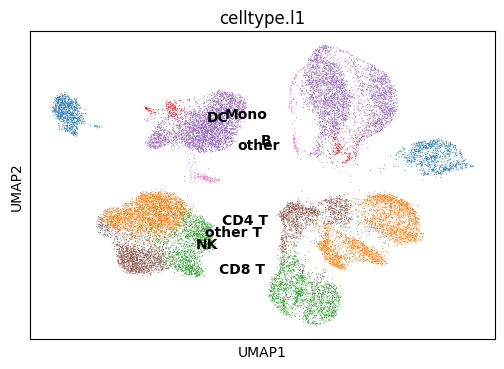

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


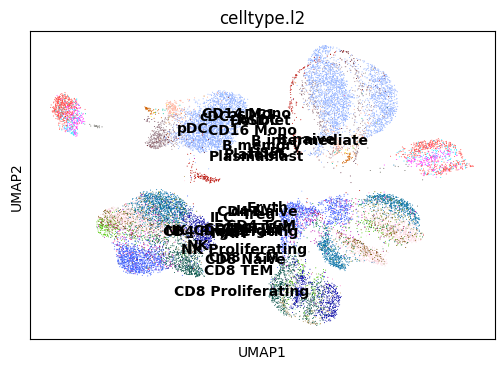

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


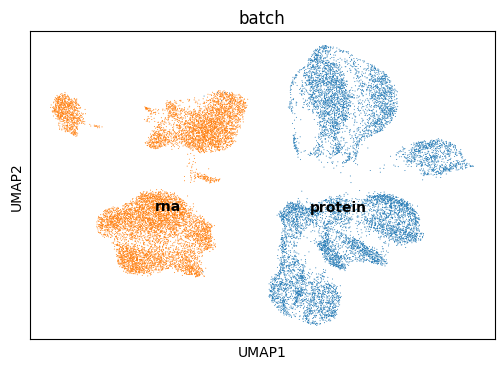

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.281,
lv2 matching acc: 0.197.
For All matchings: FOSCTTM score: 0.45211062999999996, 
Knn Alignment score: [0.0004 0.0004 0.0007 0.0009 0.0012 0.0014 0.0014 0.0018 0.002  0.002
 0.0024 0.0028 0.003  0.0032 0.0034 0.0036 0.0038 0.004  0.0041 0.0046
 0.0048 0.0049 0.0052 0.0055 0.0057]
For All matchings: Silhouette F1 score for lv1: 0.35441025939499177, 
Silhouette F1 score for lv2: 0.3419459359422383



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  5.45376181602478
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.312,
lv2 matching acc: 0.254.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.247,
lv2 matching acc: 0.131.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


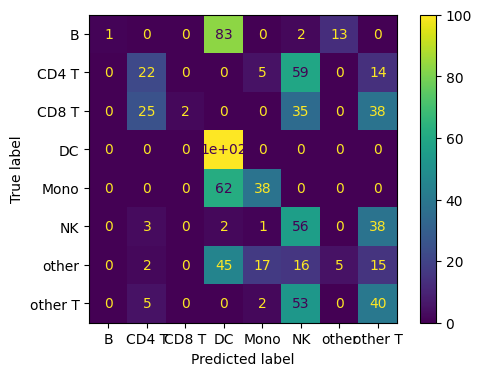

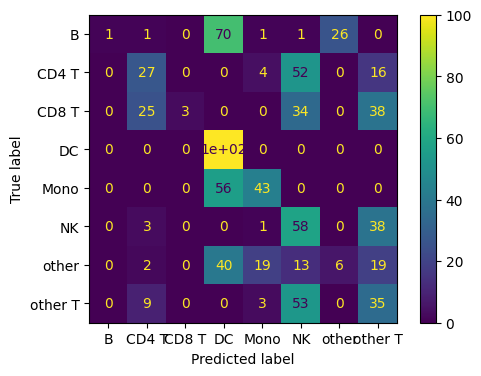

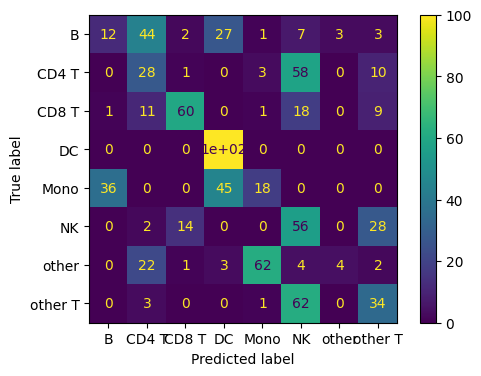

Epoch: 50: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 50: 40it [00:06,  5.92it/s]
Epoch: 51: 40it [00:06,  6.03it/s]
Epoch: 52: 40it [00:06,  5.93it/s]
Epoch: 53: 40it [00:06,  6.07it/s]
Epoch: 54: 40it [00:06,  6.00it/s]
Epoch: 55: 40it [00:06,  6.09it/s]
Epoch: 56: 40it [00:06,  6.10it/s]
Epoch: 57: 40it [00:06,  5.98it/s]
Epoch: 58: 40it [00:06,  6.10it/s]
Epoch: 59: 40it [00:06,  6.02it/s]
Epoch: 60: 40it [00:06,  5.98it/s]
Epoch: 61: 40it [00:06,  6.05it/s]
Epoch: 62: 40it [00:06,  5.97it/s

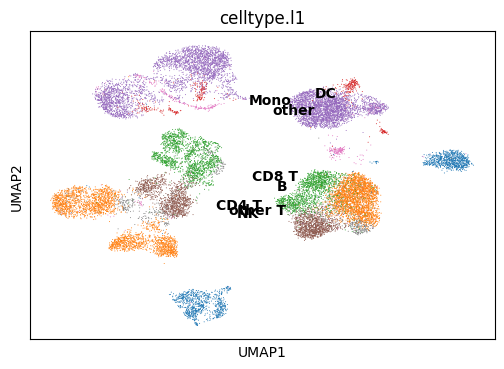

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


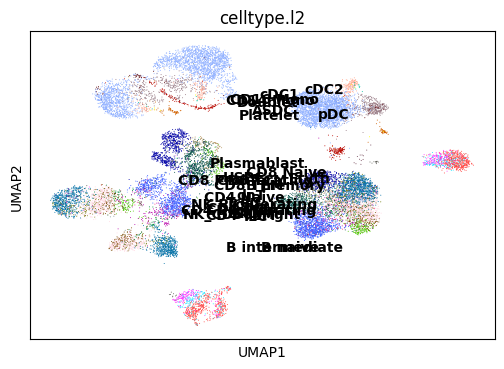

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


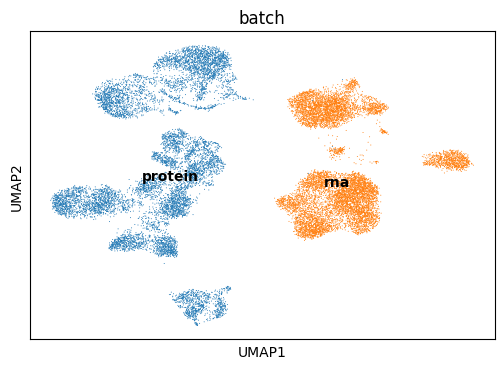

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.526,
lv2 matching acc: 0.406.
For All matchings: FOSCTTM score: 0.35793294999999997, 
Knn Alignment score: [0.0005 0.0015 0.0021 0.0027 0.0031 0.0037 0.0041 0.0044 0.0047 0.0051
 0.0056 0.0059 0.0063 0.0068 0.0073 0.0074 0.0083 0.0084 0.0087 0.0089
 0.0098 0.0101 0.0105 0.0109 0.0113]
For All matchings: Silhouette F1 score for lv1: 0.42070601939081426, 
Silhouette F1 score for lv2: 0.40977963501679804



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  4.2300169467926025
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.600,
lv2 matching acc: 0.500.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.613,
lv2 matching acc: 0.399.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


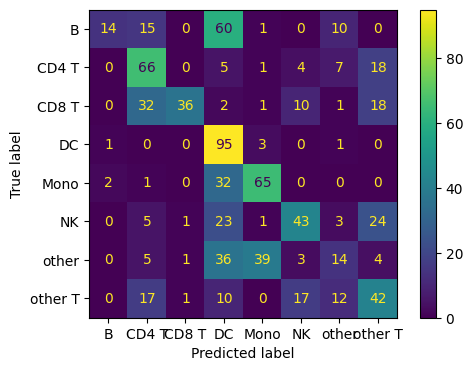

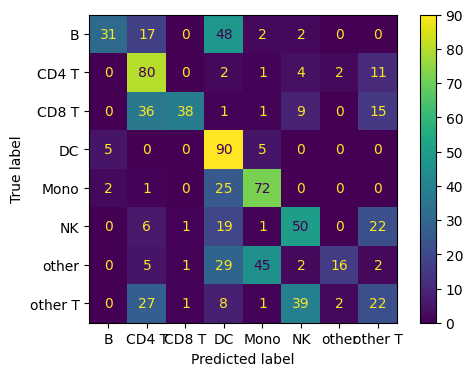

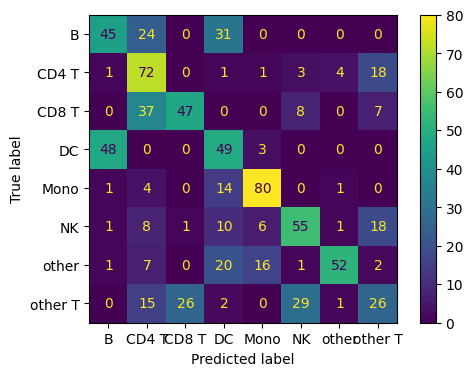

Epoch: 100: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 100: 40it [00:06,  6.01it/s]
Epoch: 101: 40it [00:06,  5.99it/s]
Epoch: 102: 40it [00:06,  6.03it/s]
Epoch: 103: 40it [00:06,  6.02it/s]
Epoch: 104: 40it [00:06,  6.03it/s]
Epoch: 105: 40it [00:06,  5.85it/s]
Epoch: 106: 40it [00:07,  5.61it/s]
Epoch: 107: 40it [00:06,  5.87it/s]
Epoch: 108: 40it [00:06,  5.88it/s]
Epoch: 109: 40it [00:06,  5.93it/s]
Epoch: 110: 40it [00:07,  5.64it/s]
Epoch: 111: 40it [00:06,  5.92it/s]
Epoch: 112: 40it [00

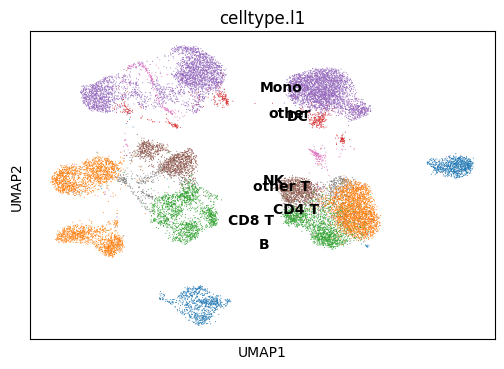

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


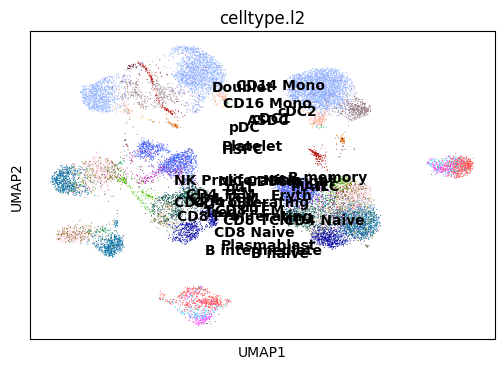

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


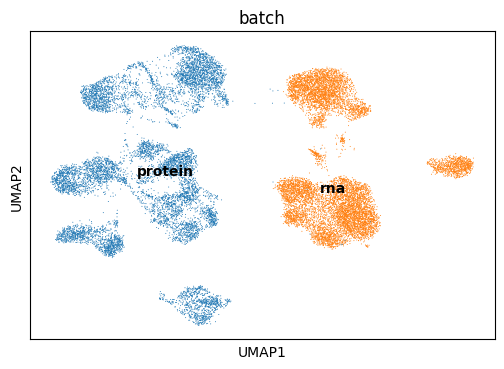

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.601,
lv2 matching acc: 0.465.
For All matchings: FOSCTTM score: 0.31160886, 
Knn Alignment score: [0.0011 0.0024 0.003  0.0034 0.0042 0.0051 0.0062 0.007  0.0074 0.0081
 0.0085 0.0096 0.0102 0.0108 0.0115 0.0123 0.0127 0.0132 0.0134 0.0142
 0.0144 0.0151 0.016  0.0164 0.0173]
For All matchings: Silhouette F1 score for lv1: 0.4580761635353256, 
Silhouette F1 score for lv2: 0.4490019164544384



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  4.072673797607422
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.687,
lv2 matching acc: 0.556.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.708,
lv2 matching acc: 0.496.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


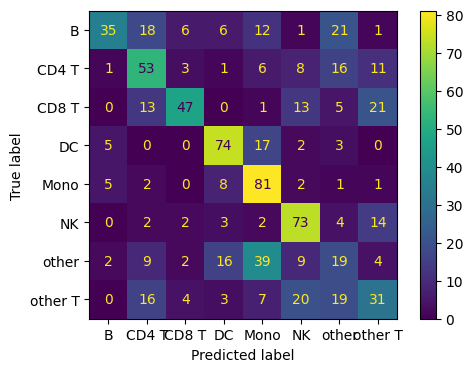

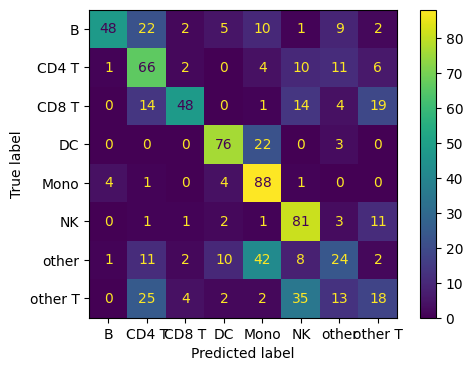

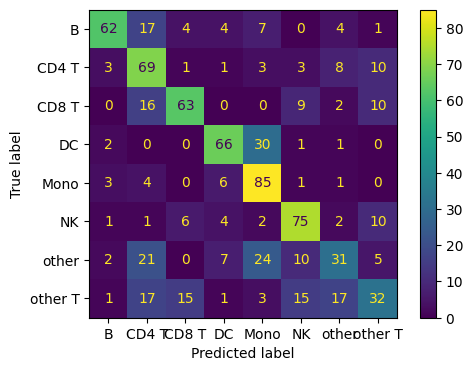

Epoch: 150: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 150: 40it [00:06,  6.02it/s]
Epoch: 151: 40it [00:06,  5.96it/s]
Epoch: 152: 40it [00:06,  5.95it/s]
Epoch: 153: 40it [00:06,  5.99it/s]
Epoch: 154: 40it [00:06,  5.90it/s]
Epoch: 155: 40it [00:06,  5.90it/s]
Epoch: 156: 40it [00:06,  5.93it/s]
Epoch: 157: 40it [00:06,  5.85it/s]
Epoch: 158: 40it [00:06,  5.89it/s]
Epoch: 159: 40it [00:06,  5.91it/s]
Epoch: 160: 40it [00:06,  5.97it/s]
Epoch: 161: 40it [00:06,  5.95it/s]
Epoch: 162: 40it [00

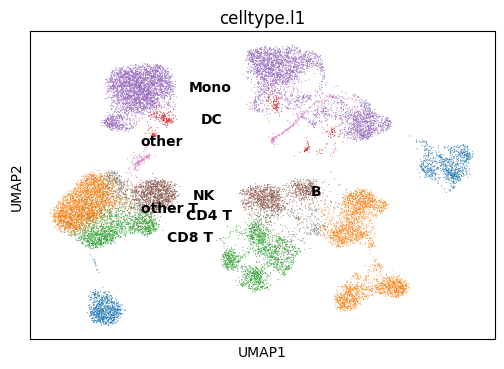

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


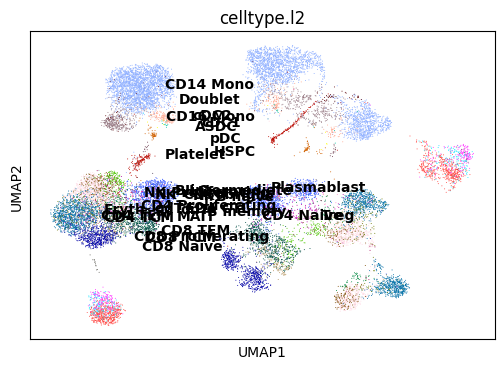

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


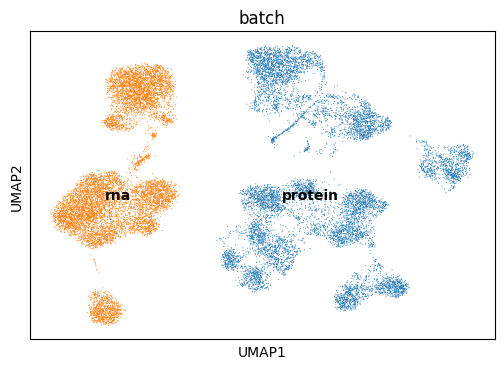

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.688,
lv2 matching acc: 0.481.
For All matchings: FOSCTTM score: 0.29346076, 
Knn Alignment score: [0.0003 0.0013 0.0028 0.0039 0.0049 0.0059 0.0069 0.0083 0.009  0.0097
 0.0105 0.0112 0.0121 0.0124 0.013  0.0137 0.0145 0.0157 0.0165 0.0172
 0.0177 0.0186 0.019  0.0194 0.0201]
For All matchings: Silhouette F1 score for lv1: 0.47232897429180526, 
Silhouette F1 score for lv2: 0.46422002657042616



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.8604607582092285
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.744,
lv2 matching acc: 0.532.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.717,
lv2 matching acc: 0.494.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


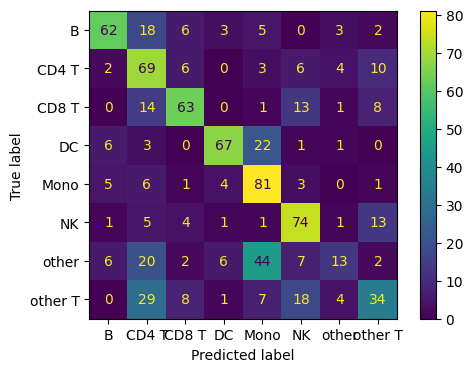

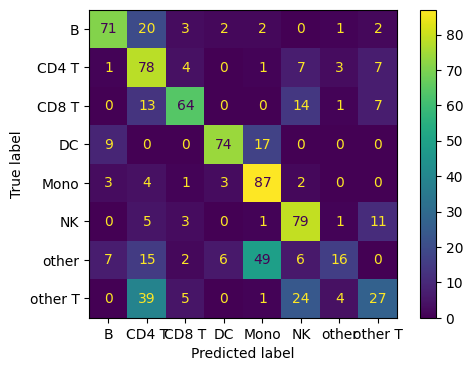

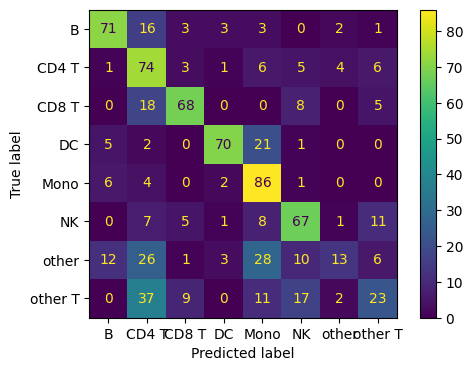

Epoch: 200: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 200: 40it [00:06,  6.04it/s]
Epoch: 201: 40it [00:06,  6.07it/s]
Epoch: 202: 40it [00:06,  5.95it/s]
Epoch: 203: 40it [00:06,  5.95it/s]
Epoch: 204: 40it [00:06,  6.00it/s]
Epoch: 205: 40it [00:06,  5.94it/s]
Epoch: 206: 40it [00:06,  5.90it/s]
Epoch: 207: 40it [00:06,  5.92it/s]
Epoch: 208: 40it [00:06,  5.82it/s]
Epoch: 209: 40it [00:06,  5.90it/s]
Epoch: 210: 40it [00:06,  5.94it/s]
Epoch: 211: 40it [00:06,  5.96it/s]
Epoch: 212: 40it [00

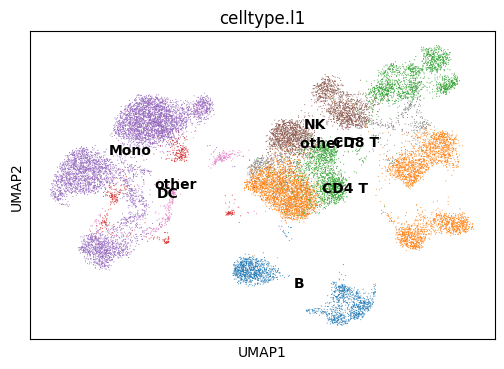

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


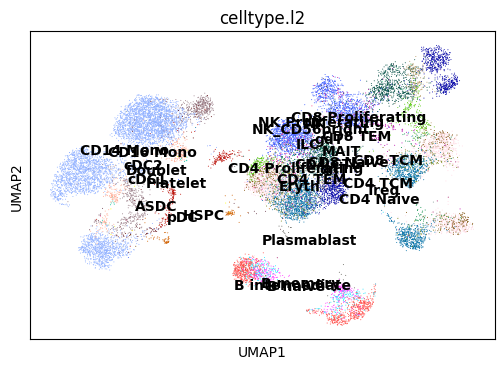

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


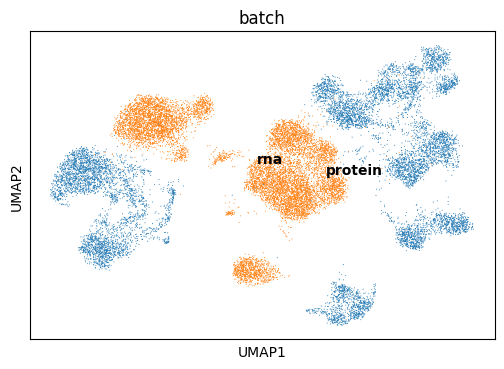

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.701,
lv2 matching acc: 0.518.
For All matchings: FOSCTTM score: 0.28816083000000003, 
Knn Alignment score: [0.0008 0.0019 0.0028 0.0043 0.0051 0.0058 0.0068 0.0076 0.0089 0.0096
 0.0106 0.0114 0.0128 0.0136 0.0144 0.0147 0.0153 0.016  0.0167 0.0178
 0.0182 0.019  0.0196 0.0205 0.0212]
For All matchings: Silhouette F1 score for lv1: 0.48538733074818624, 
Silhouette F1 score for lv2: 0.47709883578699164



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.6307350397109985
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.767,
lv2 matching acc: 0.594.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.698,
lv2 matching acc: 0.483.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


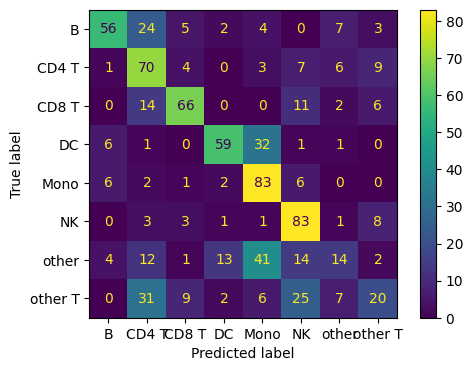

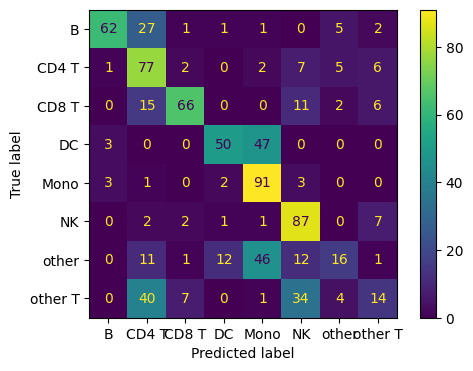

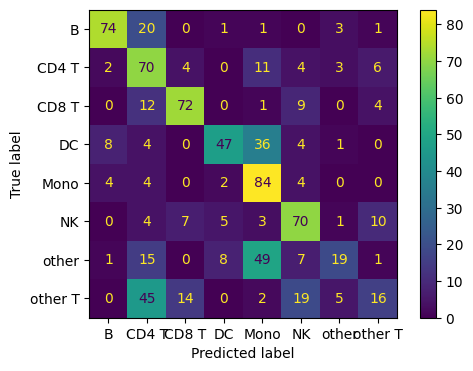

Epoch: 250: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 250: 40it [00:06,  5.93it/s]
Epoch: 251: 40it [00:06,  5.85it/s]
Epoch: 252: 40it [00:06,  5.97it/s]
Epoch: 253: 40it [00:06,  6.03it/s]
Epoch: 254: 40it [00:06,  6.01it/s]
Epoch: 255: 40it [00:06,  6.00it/s]
Epoch: 256: 40it [00:06,  5.95it/s]
Epoch: 257: 40it [00:06,  5.90it/s]
Epoch: 258: 40it [00:06,  5.84it/s]
Epoch: 259: 40it [00:06,  5.92it/s]
Epoch: 260: 40it [00:07,  5.71it/s]
Epoch: 261: 40it [00:06,  5.93it/s]
Epoch: 262: 40it [00

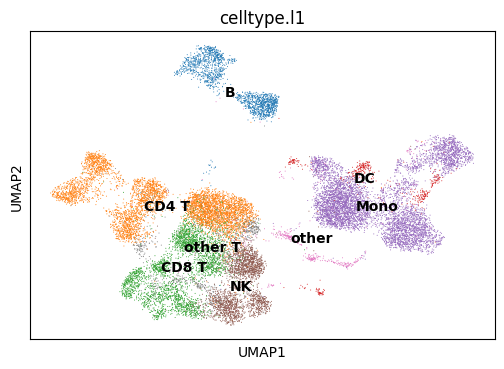

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


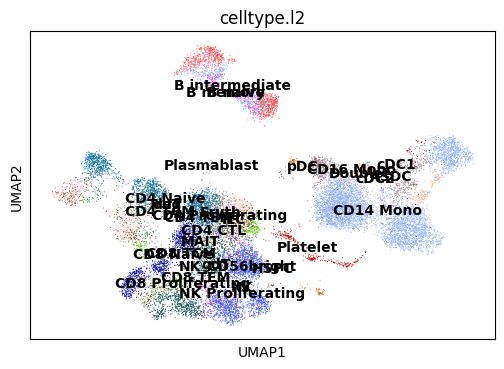

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


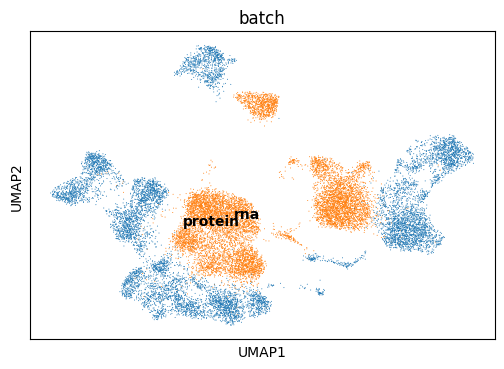

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.724,
lv2 matching acc: 0.543.
For All matchings: FOSCTTM score: 0.2787354100000001, 
Knn Alignment score: [0.0012 0.0018 0.0024 0.003  0.0042 0.0049 0.0052 0.0059 0.0065 0.0074
 0.009  0.01   0.0112 0.0123 0.0131 0.0136 0.0144 0.0148 0.015  0.0156
 0.0163 0.017  0.0174 0.018  0.0192]
For All matchings: Silhouette F1 score for lv1: 0.49380678571440517, 
Silhouette F1 score for lv2: 0.4847562033260146


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])





Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.4336870908737183
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.796,
lv2 matching acc: 0.630.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scipy\sparse\_index.py:143: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.733,
lv2 matching acc: 0.523.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


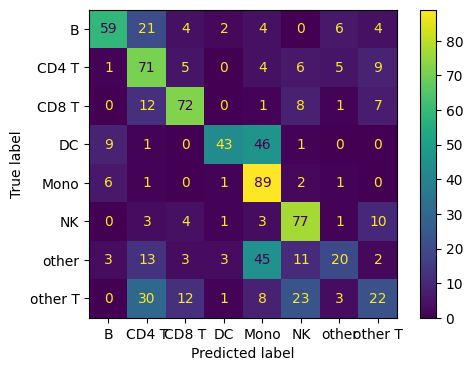

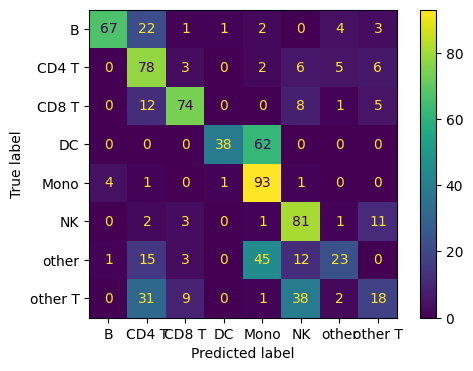

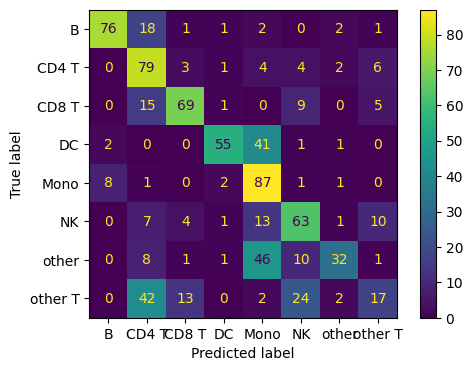

Epoch: 300: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 300: 40it [00:07,  5.12it/s]
Epoch: 301: 40it [00:06,  5.96it/s]
Epoch: 302: 40it [00:07,  5.65it/s]
Epoch: 303: 40it [00:06,  5.97it/s]
Epoch: 304: 40it [00:06,  6.02it/s]
Epoch: 305: 40it [00:06,  5.86it/s]
Epoch: 306: 40it [00:06,  5.91it/s]
Epoch: 307: 40it [00:06,  5.94it/s]
Epoch: 308: 40it [00:06,  5.90it/s]
Epoch: 309: 40it [00:06,  6.01it/s]
Epoch: 310: 40it [00:06,  5.94it/s]
Epoch: 311: 40it [00:06,  5.84it/s]
Epoch: 312: 40it [00

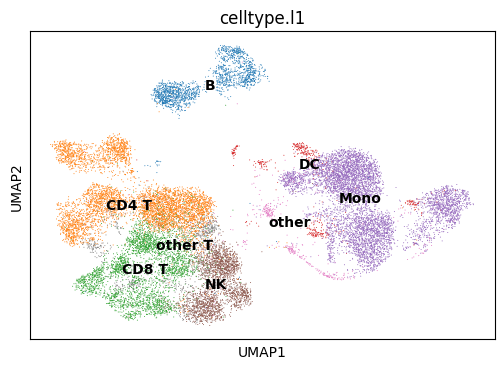

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


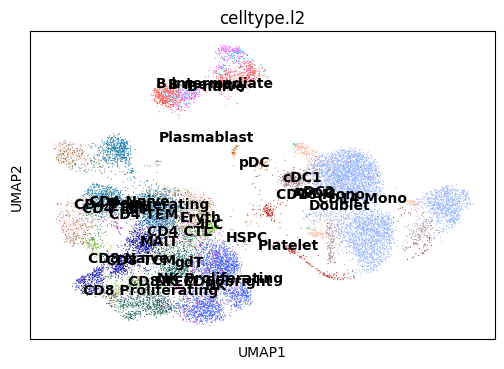

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


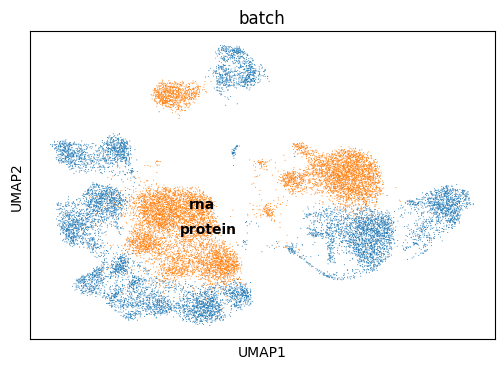

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.728,
lv2 matching acc: 0.529.
For All matchings: FOSCTTM score: 0.27431613000000005, 
Knn Alignment score: [0.0013 0.0025 0.0039 0.0048 0.006  0.0072 0.0081 0.0089 0.0092 0.0102
 0.011  0.0119 0.0122 0.0127 0.0137 0.0142 0.0149 0.0155 0.016  0.0164
 0.0168 0.0171 0.0181 0.0188 0.0197]
For All matchings: Silhouette F1 score for lv1: 0.49957344228899975, 
Silhouette F1 score for lv2: 0.49063731058886556



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.2746704816818237
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.805,
lv2 matching acc: 0.611.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.704,
lv2 matching acc: 0.496.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


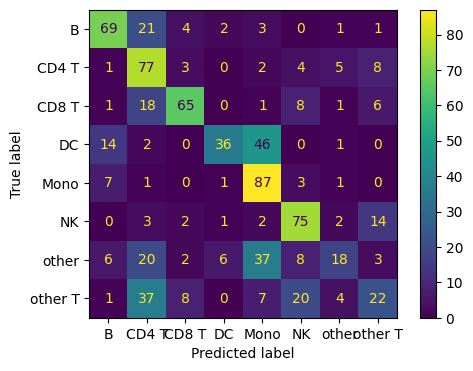

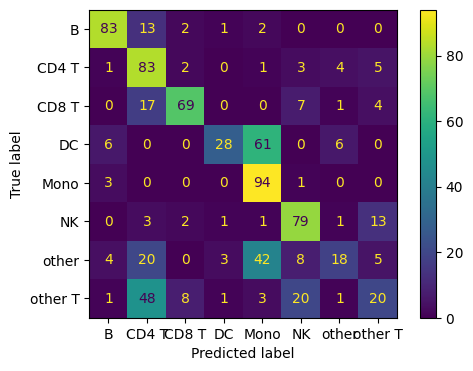

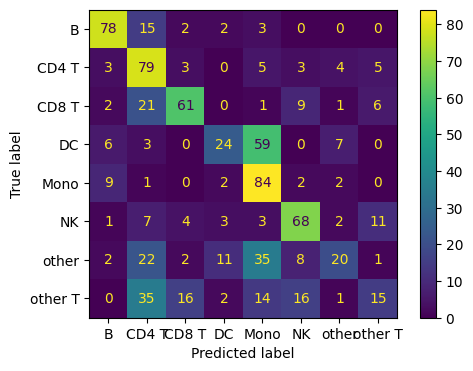

Epoch: 350: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 350: 40it [00:06,  6.08it/s]
Epoch: 351: 40it [00:06,  5.97it/s]
Epoch: 352: 40it [00:06,  5.93it/s]
Epoch: 353: 40it [00:06,  5.95it/s]
Epoch: 354: 40it [00:06,  5.83it/s]
Epoch: 355: 40it [00:06,  5.94it/s]
Epoch: 356: 40it [00:06,  5.95it/s]
Epoch: 357: 40it [00:06,  5.96it/s]
Epoch: 358: 40it [00:06,  5.98it/s]
Epoch: 359: 40it [00:06,  5.94it/s]
Epoch: 360: 40it [00:06,  5.82it/s]
Epoch: 361: 40it [00:06,  5.81it/s]
Epoch: 362: 40it [00

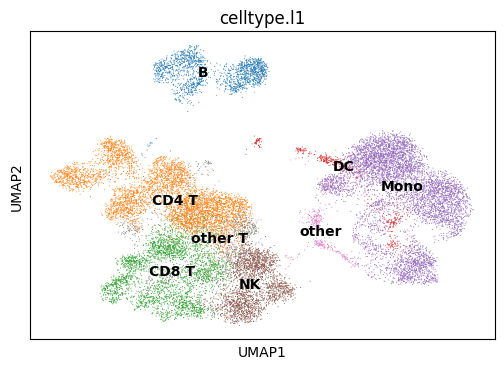

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


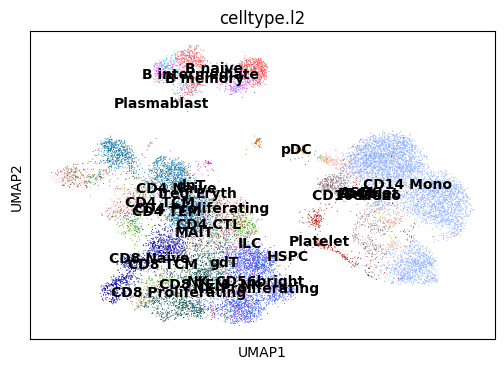

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


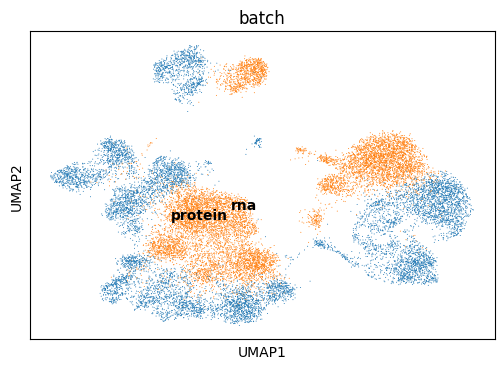

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.726,
lv2 matching acc: 0.536.
For All matchings: FOSCTTM score: 0.27420905, 
Knn Alignment score: [0.0007 0.0017 0.0024 0.003  0.0038 0.0051 0.0059 0.0068 0.0077 0.0083
 0.0089 0.0091 0.0097 0.0103 0.0112 0.0114 0.0121 0.0128 0.0135 0.0138
 0.0146 0.0149 0.0157 0.0167 0.0171]
For All matchings: Silhouette F1 score for lv1: 0.5038167688750217, 
Silhouette F1 score for lv2: 0.4948942343954144



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.132145047187805
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.804,
lv2 matching acc: 0.623.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.716,
lv2 matching acc: 0.508.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


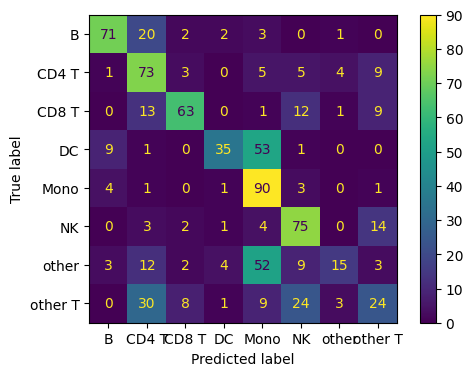

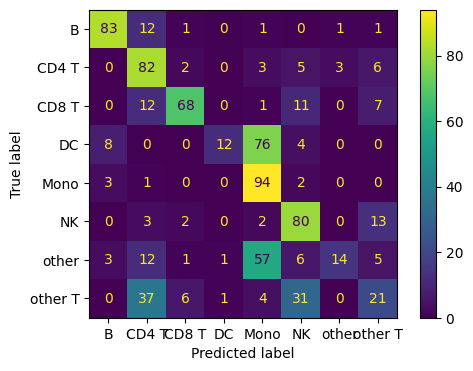

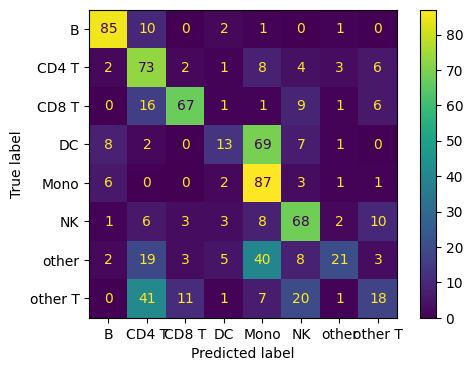

Epoch: 400: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 400: 40it [00:06,  6.05it/s]
Epoch: 401: 40it [00:06,  5.97it/s]
Epoch: 402: 40it [00:06,  5.96it/s]
Epoch: 403: 40it [00:06,  5.96it/s]
Epoch: 404: 40it [00:06,  5.95it/s]
Epoch: 405: 40it [00:06,  5.98it/s]
Epoch: 406: 40it [00:06,  5.91it/s]
Epoch: 407: 40it [00:06,  5.94it/s]
Epoch: 408: 40it [00:06,  5.82it/s]
Epoch: 409: 40it [00:06,  5.94it/s]
Epoch: 410: 40it [00:06,  5.86it/s]
Epoch: 411: 40it [00:06,  5.94it/s]
Epoch: 412: 40it [00

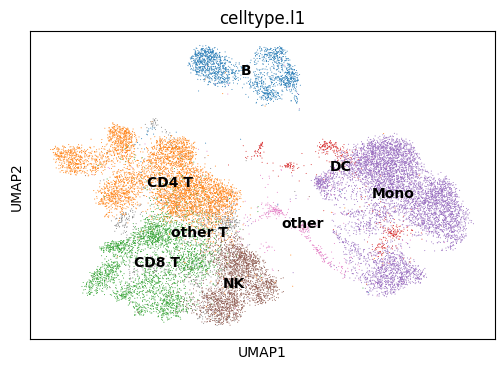

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


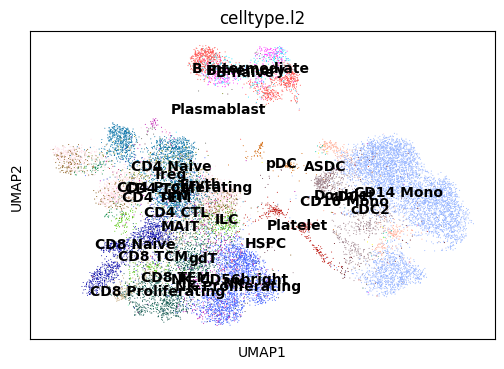

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


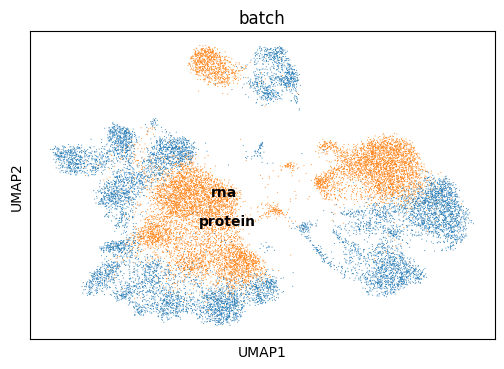

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.721,
lv2 matching acc: 0.534.
For All matchings: FOSCTTM score: 0.27140436, 
Knn Alignment score: [0.0012 0.0022 0.0036 0.0046 0.0061 0.0074 0.0078 0.0086 0.0093 0.0099
 0.0104 0.011  0.0113 0.012  0.0128 0.0131 0.014  0.0147 0.0155 0.0163
 0.0169 0.0175 0.0181 0.0188 0.0194]
For All matchings: Silhouette F1 score for lv1: 0.5071352227705285, 
Silhouette F1 score for lv2: 0.4981830521548025



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.074210047721863
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.811,
lv2 matching acc: 0.636.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.703,
lv2 matching acc: 0.498.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


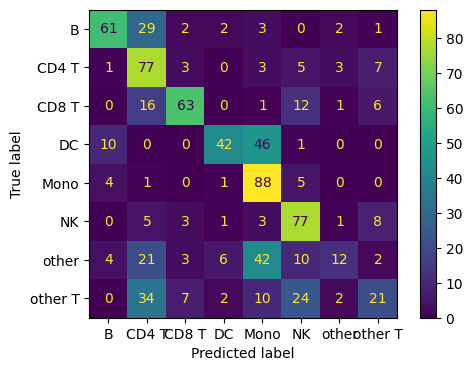

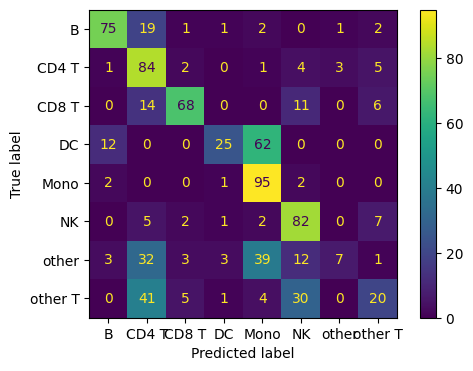

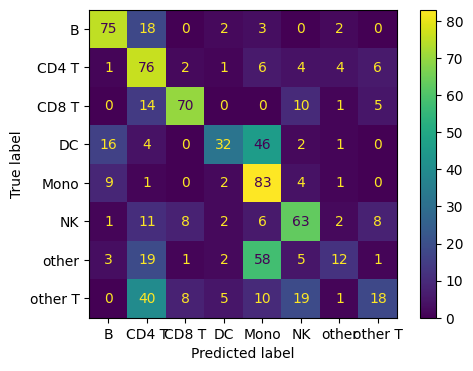

Epoch: 450: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 450: 40it [00:06,  5.89it/s]
Epoch: 451: 40it [00:06,  6.05it/s]
Epoch: 452: 40it [00:06,  5.97it/s]
Epoch: 453: 40it [00:06,  5.94it/s]
Epoch: 454: 40it [00:06,  5.97it/s]
Epoch: 455: 40it [00:06,  6.03it/s]
Epoch: 456: 40it [00:06,  5.94it/s]
Epoch: 457: 40it [00:06,  5.91it/s]
Epoch: 458: 40it [00:06,  5.84it/s]
Epoch: 459: 40it [00:06,  5.93it/s]
Epoch: 460: 40it [00:06,  5.96it/s]
Epoch: 461: 40it [00:06,  5.93it/s]
Epoch: 462: 40it [00

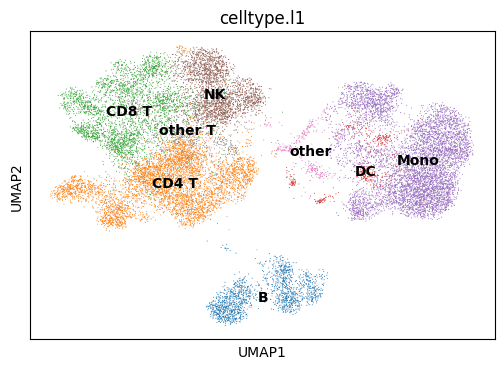

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


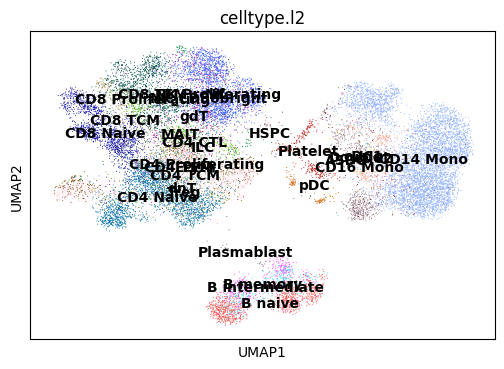

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


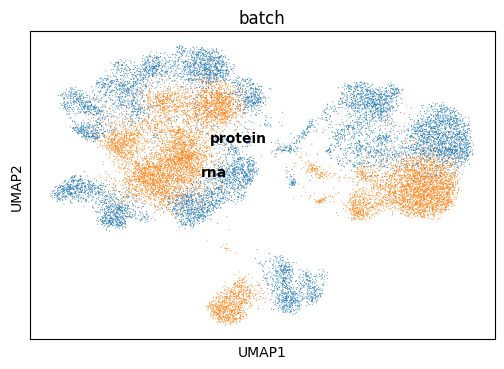

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.731,
lv2 matching acc: 0.531.
For All matchings: FOSCTTM score: 0.2689570499999999, 
Knn Alignment score: [0.001  0.0017 0.0023 0.0036 0.0046 0.005  0.0059 0.0065 0.0073 0.0081
 0.0086 0.009  0.01   0.0106 0.011  0.0113 0.0126 0.0132 0.0139 0.0148
 0.0154 0.0165 0.0171 0.0177 0.0187]
For All matchings: Silhouette F1 score for lv1: 0.5089787834328218, 
Silhouette F1 score for lv2: 0.5000600049337938



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  3.011489510536194
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.818,
lv2 matching acc: 0.628.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.731,
lv2 matching acc: 0.510.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


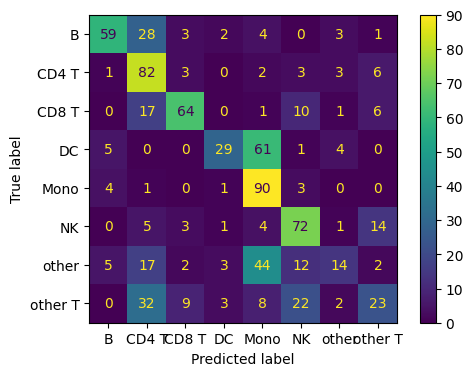

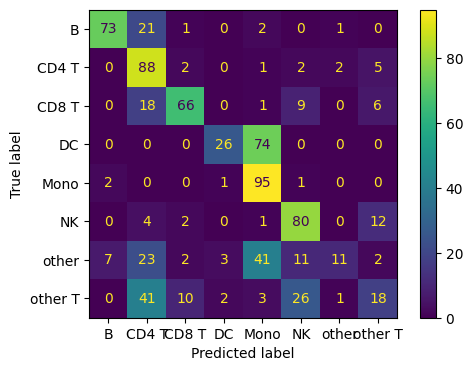

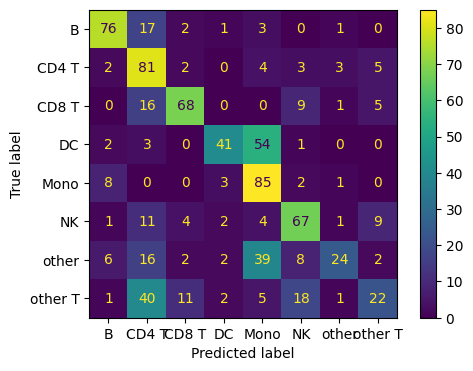

Epoch: 500: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 500: 40it [00:06,  5.99it/s]
Epoch: 501: 40it [00:06,  5.98it/s]
Epoch: 502: 40it [00:06,  6.03it/s]
Epoch: 503: 40it [00:06,  5.98it/s]
Epoch: 504: 40it [00:06,  5.97it/s]
Epoch: 505: 40it [00:06,  5.90it/s]
Epoch: 506: 40it [00:06,  5.95it/s]
Epoch: 507: 40it [00:06,  5.98it/s]
Epoch: 508: 40it [00:06,  5.97it/s]
Epoch: 509: 40it [00:06,  5.91it/s]
Epoch: 510: 40it [00:06,  5.91it/s]
Epoch: 511: 40it [00:06,  5.97it/s]
Epoch: 512: 40it [00

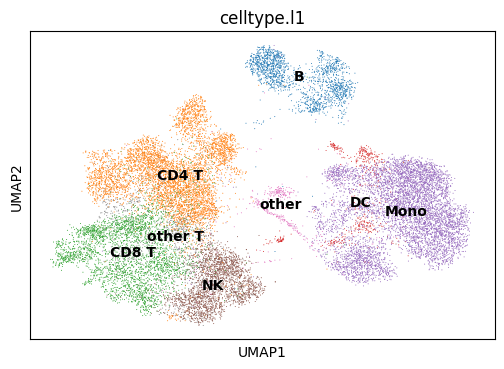

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


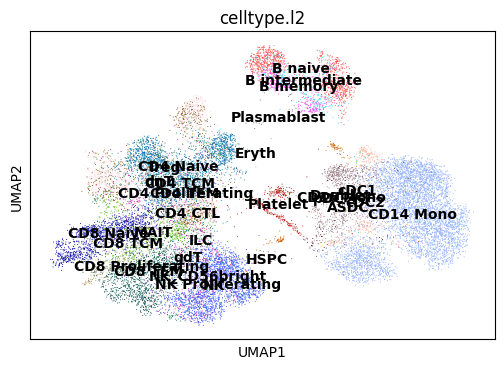

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


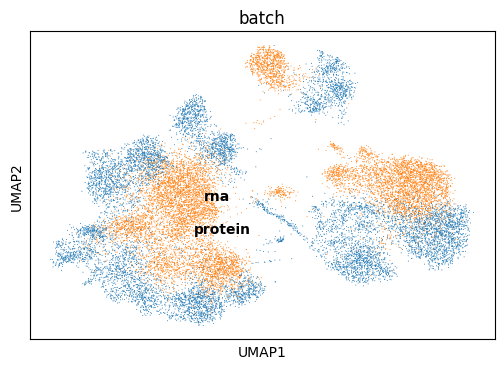

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.730,
lv2 matching acc: 0.538.
For All matchings: FOSCTTM score: 0.2743003, 
Knn Alignment score: [0.001  0.0018 0.0026 0.0029 0.0039 0.0046 0.0057 0.0059 0.0061 0.0071
 0.0079 0.0089 0.0098 0.0104 0.0114 0.0117 0.0119 0.0123 0.013  0.0141
 0.0145 0.0152 0.0162 0.0169 0.0174]
For All matchings: Silhouette F1 score for lv1: 0.5103364528536082, 
Silhouette F1 score for lv2: 0.5009394616398769



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.966405153274536
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.822,
lv2 matching acc: 0.629.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.721,
lv2 matching acc: 0.516.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


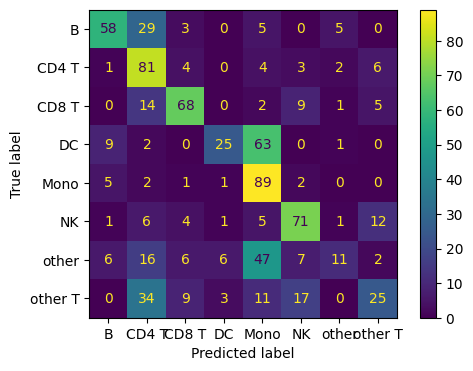

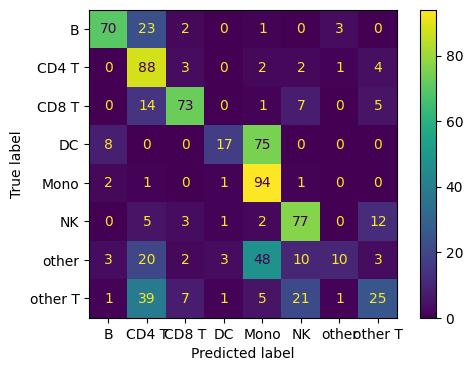

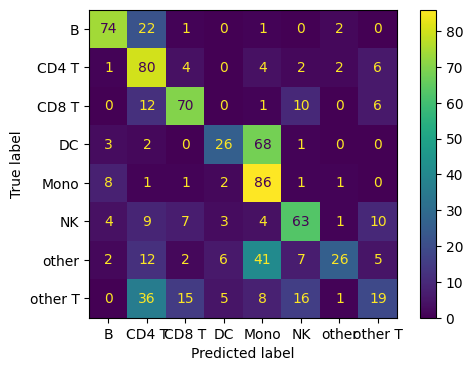

Epoch: 550: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 550: 40it [00:07,  5.71it/s]
Epoch: 551: 40it [00:06,  5.93it/s]
Epoch: 552: 40it [00:06,  5.98it/s]
Epoch: 553: 40it [00:06,  6.08it/s]
Epoch: 554: 40it [00:06,  5.85it/s]
Epoch: 555: 40it [00:07,  5.41it/s]
Epoch: 556: 40it [00:07,  5.05it/s]
Epoch: 557: 40it [00:07,  5.40it/s]
Epoch: 558: 40it [00:08,  4.64it/s]
Epoch: 559: 40it [00:07,  5.25it/s]
Epoch: 560: 40it [00:06,  5.90it/s]
Epoch: 561: 40it [00:06,  5.88it/s]
Epoch: 562: 40it [00

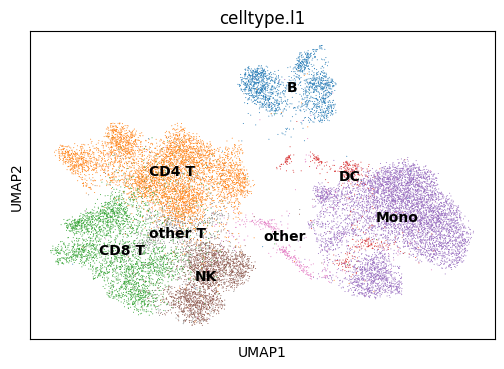

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


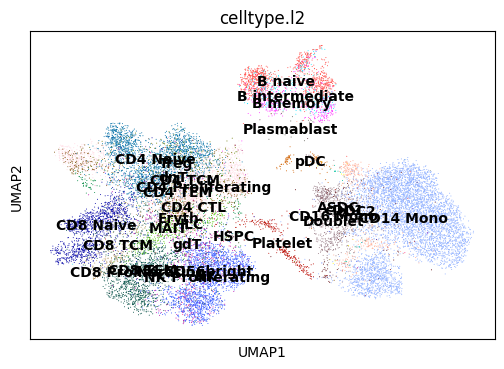

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


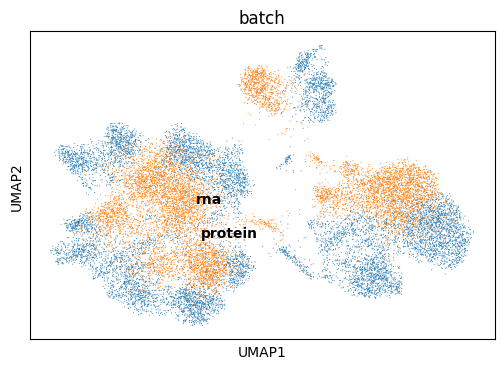

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.740,
lv2 matching acc: 0.550.
For All matchings: FOSCTTM score: 0.27035091999999994, 
Knn Alignment score: [0.0011 0.002  0.0028 0.0031 0.0045 0.0049 0.0057 0.0063 0.007  0.0076
 0.0089 0.0091 0.0098 0.0105 0.0114 0.012  0.0127 0.0133 0.0138 0.0145
 0.0158 0.0165 0.0172 0.018  0.0186]
For All matchings: Silhouette F1 score for lv1: 0.5126284339055934, 
Silhouette F1 score for lv2: 0.5033336687804983



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.9317071437835693
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.833,
lv2 matching acc: 0.656.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.723,
lv2 matching acc: 0.520.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


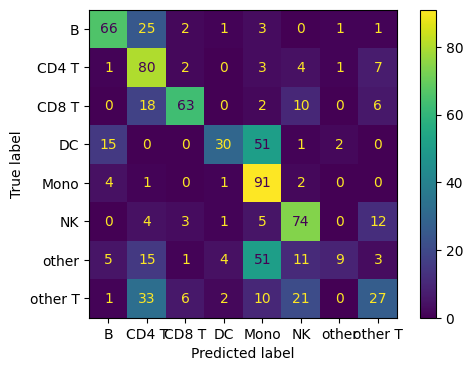

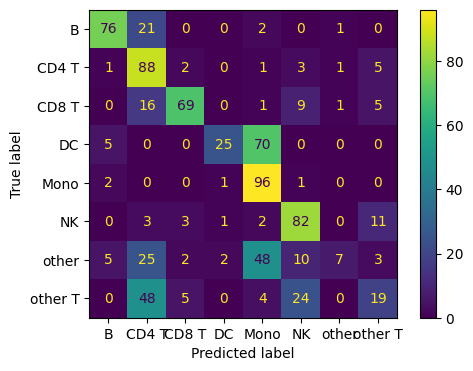

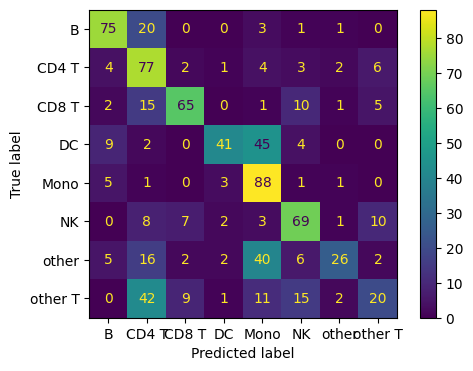

Epoch: 600: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 600: 40it [00:06,  6.04it/s]
Epoch: 601: 40it [00:06,  6.05it/s]
Epoch: 602: 40it [00:06,  5.90it/s]
Epoch: 603: 40it [00:06,  5.97it/s]
Epoch: 604: 40it [00:06,  6.00it/s]
Epoch: 605: 40it [00:06,  6.01it/s]
Epoch: 606: 40it [00:06,  6.02it/s]
Epoch: 607: 40it [00:06,  5.88it/s]
Epoch: 608: 40it [00:06,  5.84it/s]
Epoch: 609: 40it [00:06,  5.95it/s]
Epoch: 610: 40it [00:06,  5.97it/s]
Epoch: 611: 40it [00:06,  5.93it/s]
Epoch: 612: 40it [00

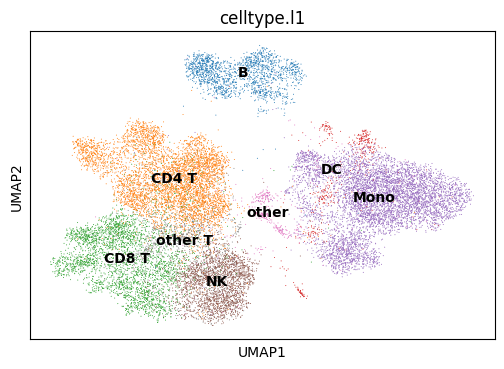

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


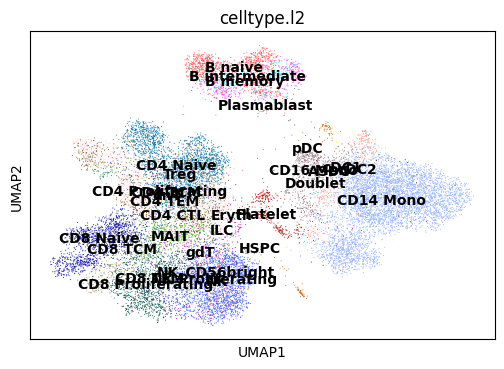

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


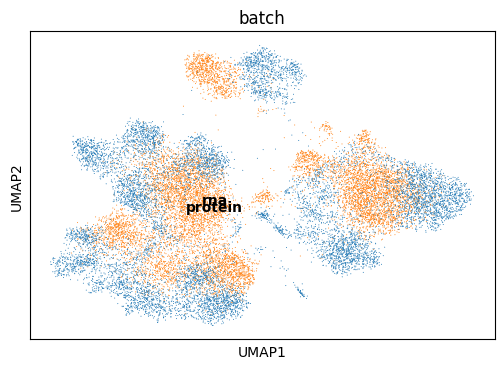

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.721,
lv2 matching acc: 0.523.
For All matchings: FOSCTTM score: 0.27604678, 
Knn Alignment score: [0.0006 0.0019 0.0026 0.0027 0.0044 0.0049 0.0057 0.0068 0.0075 0.0085
 0.0092 0.0098 0.0104 0.0113 0.0121 0.0127 0.0135 0.014  0.0142 0.0147
 0.0152 0.0159 0.0163 0.0167 0.0175]
For All matchings: Silhouette F1 score for lv1: 0.512781552237513, 
Silhouette F1 score for lv2: 0.5041616026880663



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.9136985540390015
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.813,
lv2 matching acc: 0.632.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.707,
lv2 matching acc: 0.485.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


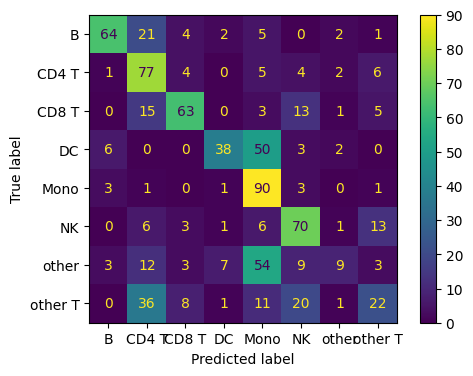

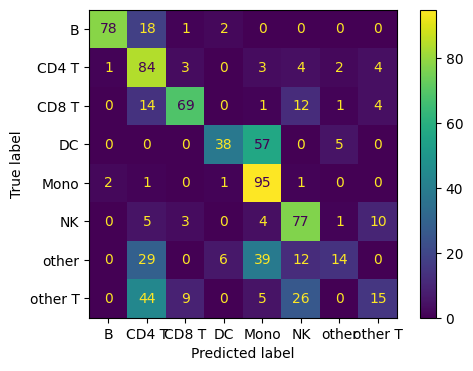

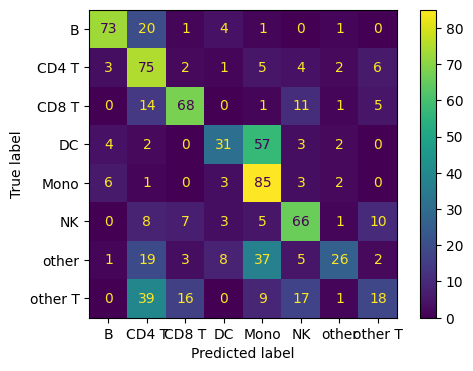

Epoch: 650: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 650: 40it [00:06,  5.91it/s]
Epoch: 651: 40it [00:06,  5.96it/s]
Epoch: 652: 40it [00:06,  5.91it/s]
Epoch: 653: 40it [00:06,  5.98it/s]
Epoch: 654: 40it [00:06,  5.96it/s]
Epoch: 655: 40it [00:06,  5.99it/s]
Epoch: 656: 40it [00:06,  6.05it/s]
Epoch: 657: 40it [00:06,  5.96it/s]
Epoch: 658: 40it [00:06,  5.91it/s]
Epoch: 659: 40it [00:06,  5.76it/s]
Epoch: 660: 40it [00:06,  5.90it/s]
Epoch: 661: 40it [00:06,  5.90it/s]
Epoch: 662: 40it [00

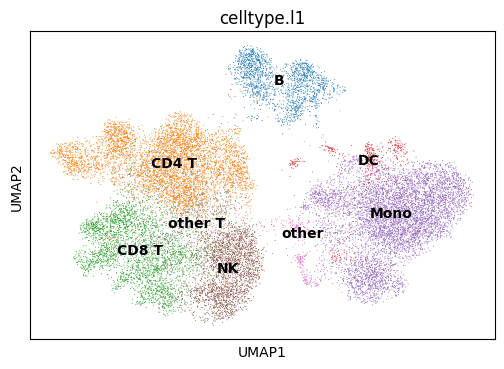

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


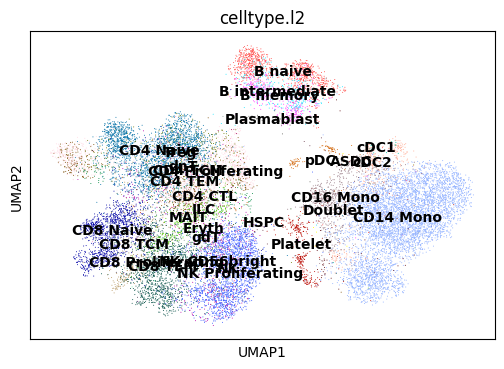

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


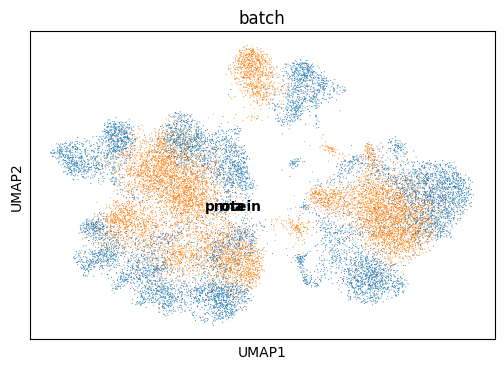

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.731,
lv2 matching acc: 0.535.
For All matchings: FOSCTTM score: 0.27878356000000004, 
Knn Alignment score: [0.0008 0.0015 0.0021 0.0027 0.0036 0.0043 0.0047 0.0052 0.0058 0.0065
 0.0072 0.0077 0.0086 0.0095 0.01   0.0103 0.0108 0.0113 0.0119 0.0122
 0.0132 0.0141 0.0148 0.0158 0.0164]
For All matchings: Silhouette F1 score for lv1: 0.5140669761202024, 
Silhouette F1 score for lv2: 0.5046168908841344



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.9072333574295044
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.830,
lv2 matching acc: 0.649.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.712,
lv2 matching acc: 0.497.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


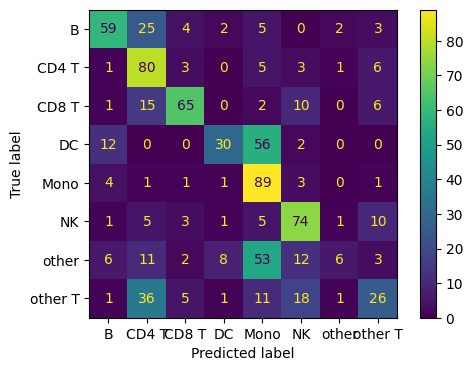

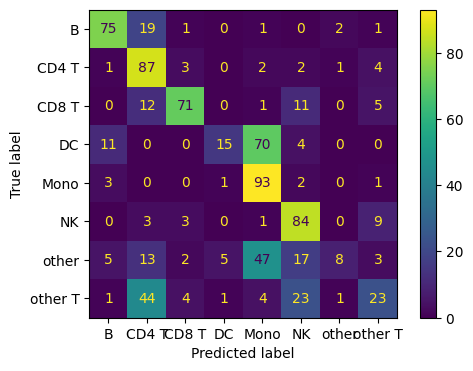

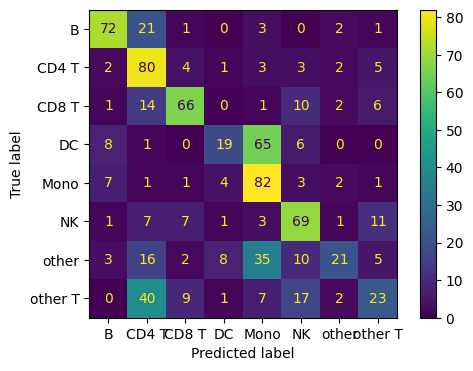

Epoch: 700: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 700: 40it [00:06,  6.09it/s]
Epoch: 701: 40it [00:06,  5.93it/s]
Epoch: 702: 40it [00:06,  5.99it/s]
Epoch: 703: 40it [00:06,  6.01it/s]
Epoch: 704: 40it [00:06,  5.99it/s]
Epoch: 705: 40it [00:06,  5.90it/s]
Epoch: 706: 40it [00:06,  5.95it/s]
Epoch: 707: 40it [00:06,  5.89it/s]
Epoch: 708: 40it [00:06,  5.91it/s]
Epoch: 709: 40it [00:06,  5.97it/s]
Epoch: 710: 40it [00:06,  5.94it/s]
Epoch: 711: 40it [00:06,  5.96it/s]
Epoch: 712: 40it [00

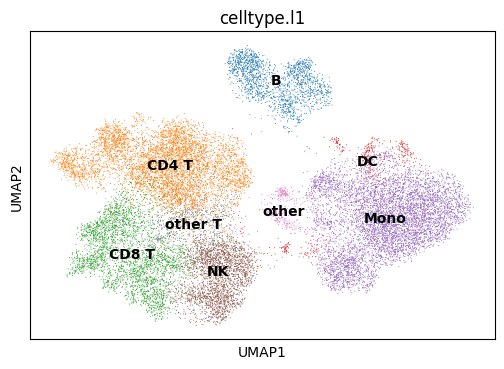

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


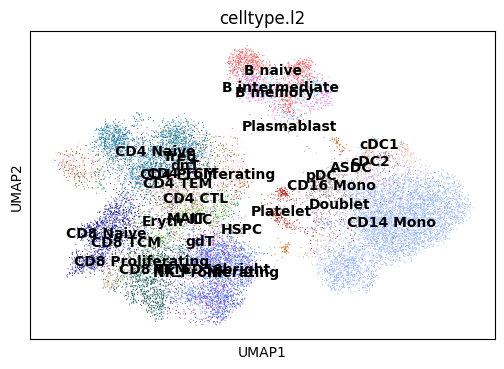

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


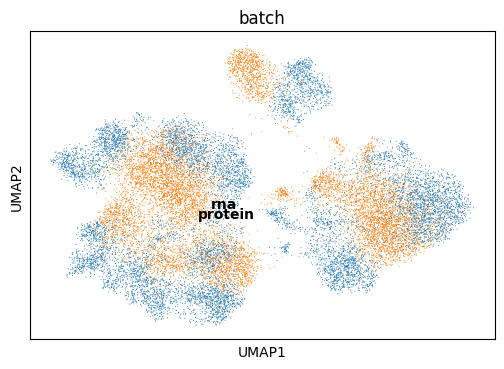

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.726,
lv2 matching acc: 0.524.
For All matchings: FOSCTTM score: 0.2813779, 
Knn Alignment score: [0.0008 0.0023 0.0032 0.0039 0.0047 0.0054 0.0061 0.007  0.0077 0.0082
 0.0089 0.0098 0.0107 0.011  0.0116 0.012  0.013  0.0135 0.0141 0.0148
 0.0154 0.0159 0.0165 0.0171 0.0177]
For All matchings: Silhouette F1 score for lv1: 0.5136374457657389, 
Silhouette F1 score for lv2: 0.5047193163315485



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.883076548576355
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.827,
lv2 matching acc: 0.638.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])





Matches are being propagated....
Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.711,
lv2 matching acc: 0.483.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


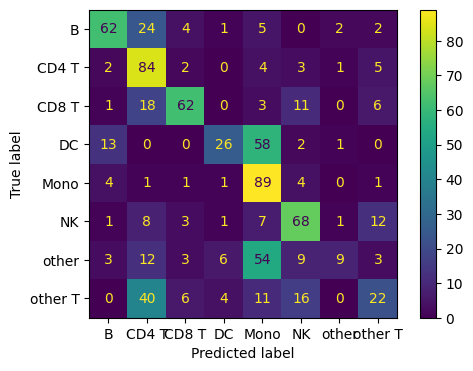

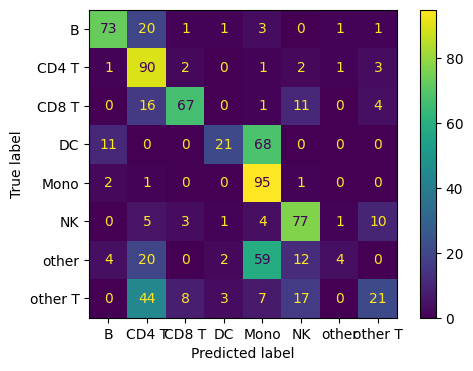

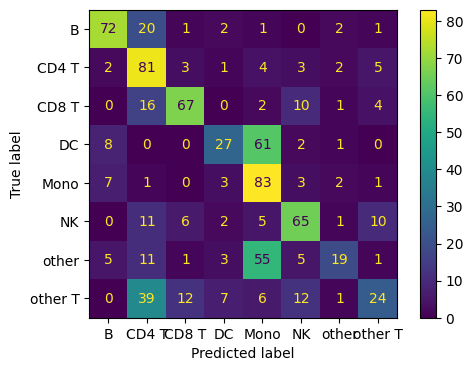

Epoch: 750: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 750: 40it [00:06,  5.89it/s]
Epoch: 751: 40it [00:06,  5.95it/s]
Epoch: 752: 40it [00:06,  6.02it/s]
Epoch: 753: 40it [00:06,  6.07it/s]
Epoch: 754: 40it [00:06,  5.97it/s]
Epoch: 755: 40it [00:06,  5.95it/s]
Epoch: 756: 40it [00:06,  5.88it/s]
Epoch: 757: 40it [00:06,  5.96it/s]
Epoch: 758: 40it [00:06,  5.89it/s]
Epoch: 759: 40it [00:06,  5.91it/s]
Epoch: 760: 40it [00:06,  5.77it/s]
Epoch: 761: 40it [00:07,  5.59it/s]
Epoch: 762: 40it [00

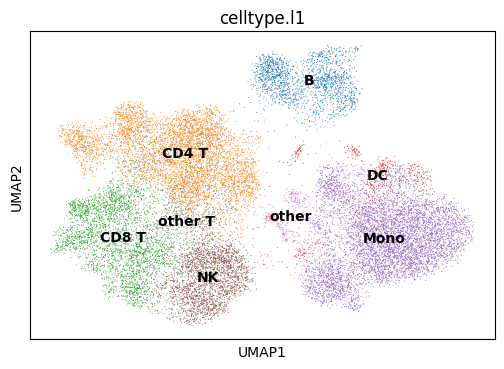

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


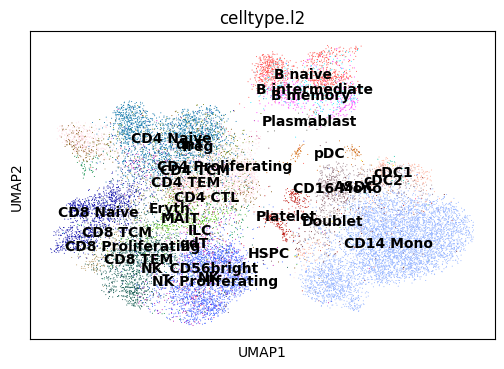

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


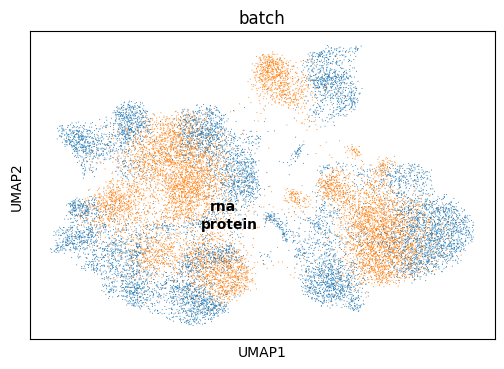

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.721,
lv2 matching acc: 0.524.
For All matchings: FOSCTTM score: 0.28585709000000004, 
Knn Alignment score: [0.001  0.0015 0.0017 0.0025 0.0035 0.0038 0.0042 0.0045 0.0051 0.0056
 0.0066 0.0074 0.008  0.0089 0.0096 0.0101 0.0112 0.0119 0.0124 0.013
 0.0139 0.0145 0.0148 0.0155 0.0161]
For All matchings: Silhouette F1 score for lv1: 0.514127159420081, 
Silhouette F1 score for lv2: 0.5047742895878357



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.900479555130005
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.819,
lv2 matching acc: 0.630.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.694,
lv2 matching acc: 0.485.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


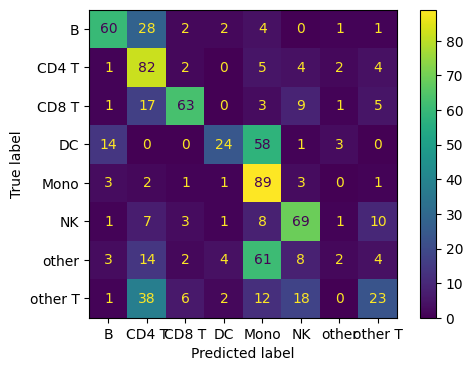

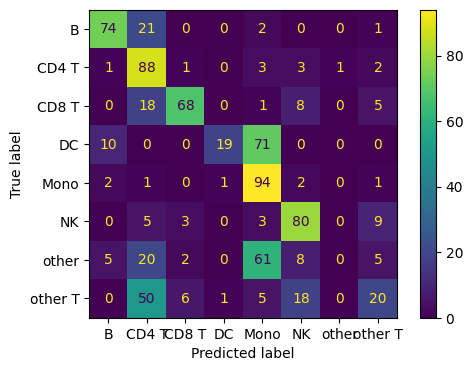

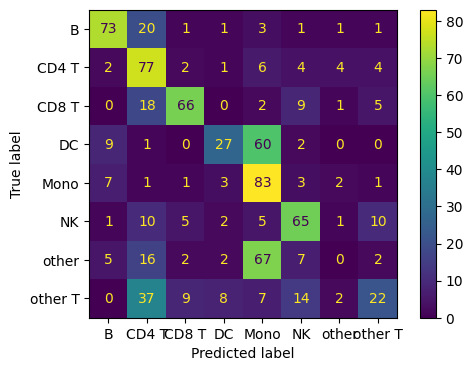

Epoch: 800: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 800: 40it [00:06,  6.02it/s]
Epoch: 801: 40it [00:06,  6.02it/s]
Epoch: 802: 40it [00:06,  6.00it/s]
Epoch: 803: 40it [00:06,  5.95it/s]
Epoch: 804: 40it [00:06,  5.82it/s]
Epoch: 805: 40it [00:06,  5.89it/s]
Epoch: 806: 40it [00:06,  6.02it/s]
Epoch: 807: 40it [00:07,  5.13it/s]
Epoch: 808: 40it [00:08,  4.97it/s]
Epoch: 809: 40it [00:08,  5.00it/s]
Epoch: 810: 40it [00:08,  4.97it/s]
Epoch: 811: 40it [00:08,  4.92it/s]
Epoch: 812: 40it [00

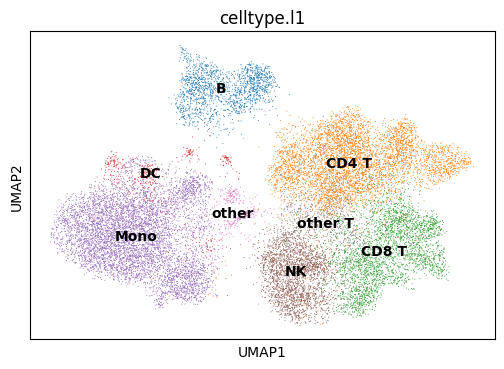

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


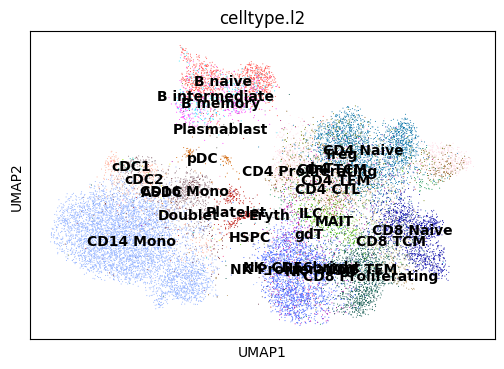

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


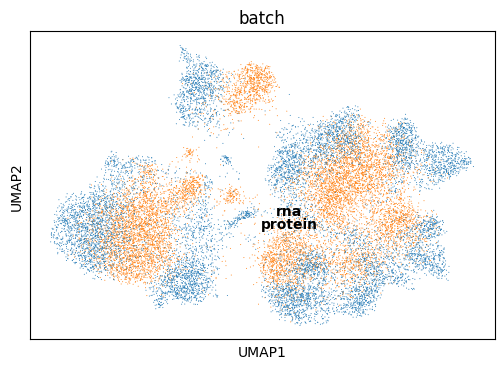

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.728,
lv2 matching acc: 0.516.
For All matchings: FOSCTTM score: 0.29333716, 
Knn Alignment score: [0.0004 0.0012 0.0025 0.0033 0.0038 0.0044 0.0057 0.0063 0.0072 0.0077
 0.0084 0.009  0.0093 0.01   0.0106 0.011  0.011  0.0119 0.0124 0.0128
 0.0132 0.0141 0.015  0.0155 0.0165]
For All matchings: Silhouette F1 score for lv1: 0.5137400781985397, 
Silhouette F1 score for lv2: 0.5046948053685439



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.9139546155929565
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.825,
lv2 matching acc: 0.619.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.705,
lv2 matching acc: 0.472.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


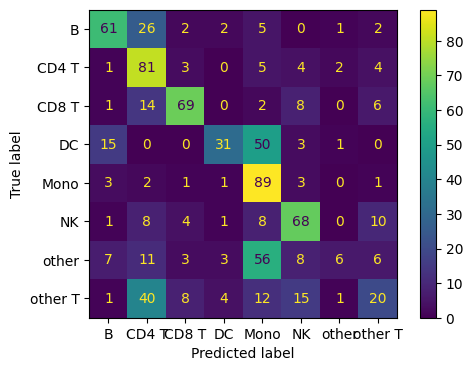

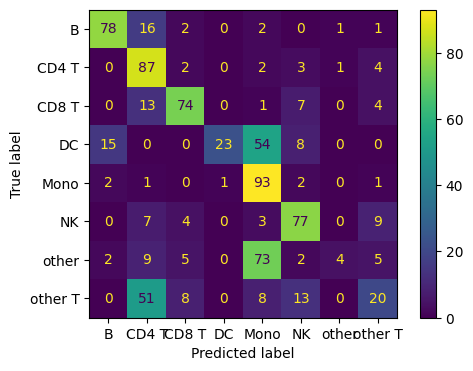

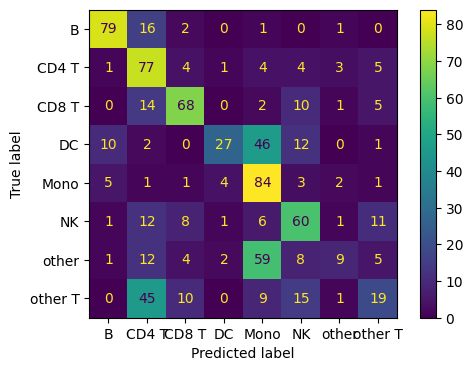

Epoch: 850: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 850: 40it [00:06,  6.03it/s]
Epoch: 851: 40it [00:06,  6.02it/s]
Epoch: 852: 40it [00:06,  5.93it/s]
Epoch: 853: 40it [00:06,  5.98it/s]
Epoch: 854: 40it [00:06,  6.02it/s]
Epoch: 855: 40it [00:06,  5.88it/s]
Epoch: 856: 40it [00:06,  5.92it/s]
Epoch: 857: 40it [00:06,  5.93it/s]
Epoch: 858: 40it [00:06,  5.98it/s]
Epoch: 859: 40it [00:06,  5.95it/s]
Epoch: 860: 40it [00:06,  5.84it/s]
Epoch: 861: 40it [00:06,  5.93it/s]
Epoch: 862: 40it [00

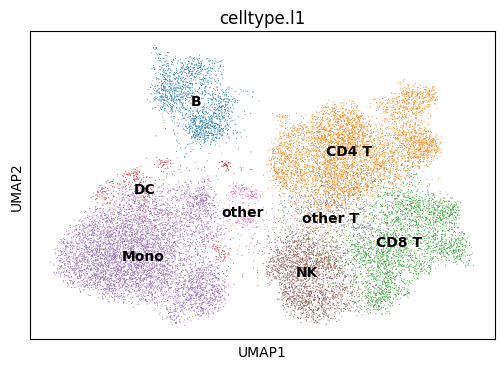

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


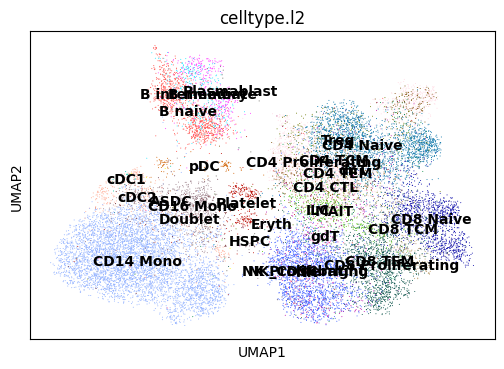

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


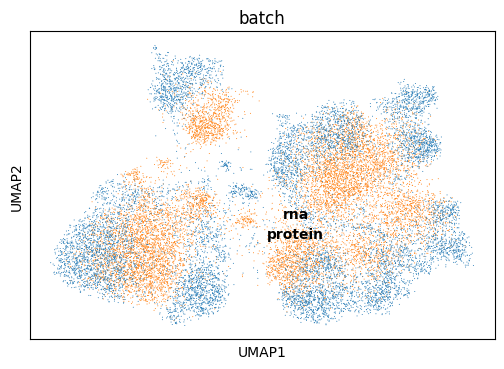

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.716,
lv2 matching acc: 0.510.
For All matchings: FOSCTTM score: 0.29093615, 
Knn Alignment score: [0.0012 0.0019 0.0028 0.0034 0.0039 0.0044 0.0048 0.0053 0.0057 0.0061
 0.0064 0.0072 0.0079 0.0086 0.0089 0.0095 0.01   0.0105 0.0114 0.012
 0.0128 0.0134 0.014  0.0151 0.0153]
For All matchings: Silhouette F1 score for lv1: 0.5137502713225711, 
Silhouette F1 score for lv2: 0.50501460423522



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.896240711212158
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.809,
lv2 matching acc: 0.610.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.692,
lv2 matching acc: 0.463.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


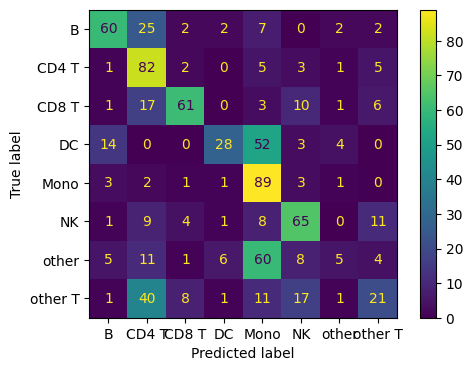

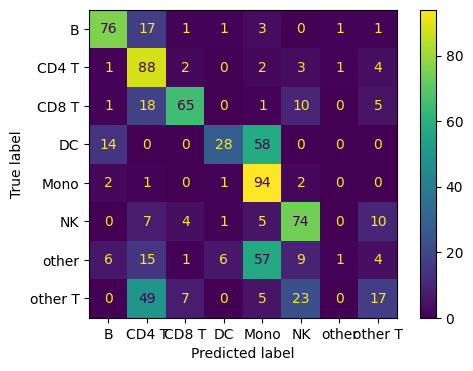

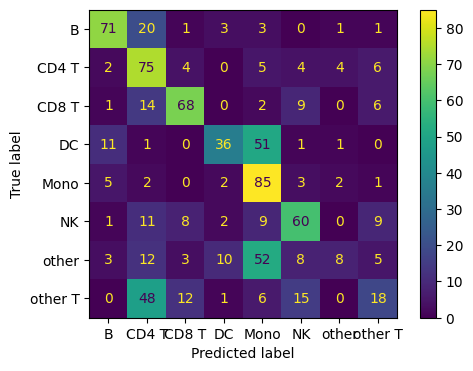

Epoch: 900: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 900: 40it [00:06,  5.90it/s]
Epoch: 901: 40it [00:06,  6.11it/s]
Epoch: 902: 40it [00:06,  6.02it/s]
Epoch: 903: 40it [00:06,  6.05it/s]
Epoch: 904: 40it [00:06,  5.95it/s]
Epoch: 905: 40it [00:06,  6.02it/s]
Epoch: 906: 40it [00:06,  5.80it/s]
Epoch: 907: 40it [00:06,  6.01it/s]
Epoch: 908: 40it [00:06,  5.93it/s]
Epoch: 909: 40it [00:06,  5.82it/s]
Epoch: 910: 40it [00:06,  6.09it/s]
Epoch: 911: 40it [00:06,  6.02it/s]
Epoch: 912: 40it [00

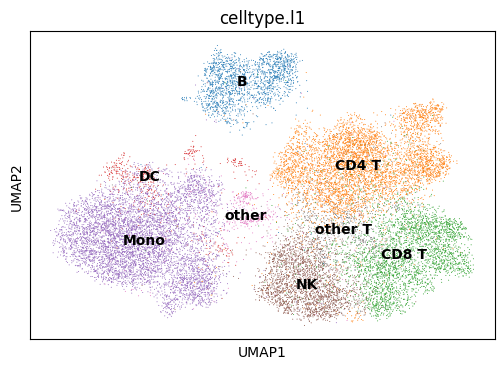

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


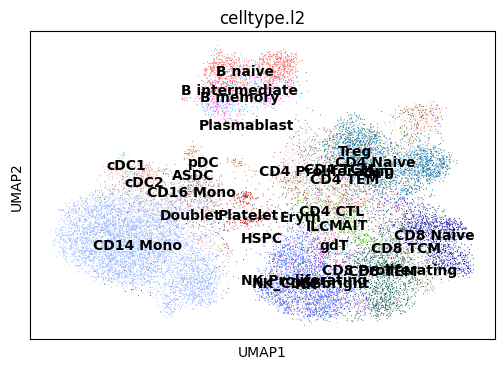

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


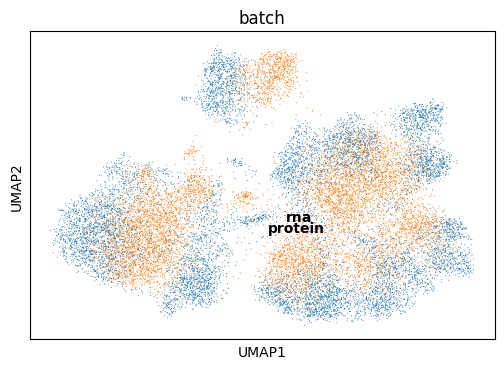

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.724,
lv2 matching acc: 0.516.
For All matchings: FOSCTTM score: 0.2921716, 
Knn Alignment score: [0.0006 0.0013 0.0026 0.0032 0.0035 0.0041 0.0048 0.0059 0.0065 0.0073
 0.0078 0.0084 0.009  0.0095 0.0103 0.0108 0.0114 0.0125 0.013  0.0139
 0.0147 0.015  0.0154 0.0157 0.0167]
For All matchings: Silhouette F1 score for lv1: 0.5138637051285825, 
Silhouette F1 score for lv2: 0.5047835451918286



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.9147194623947144
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.823,
lv2 matching acc: 0.612.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.703,
lv2 matching acc: 0.470.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


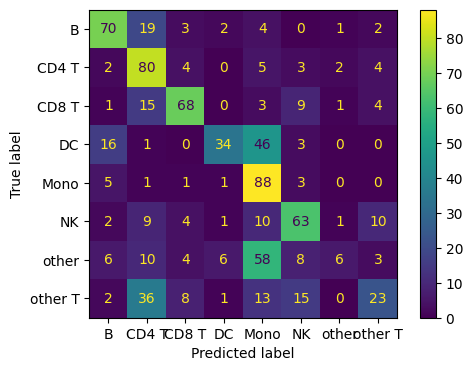

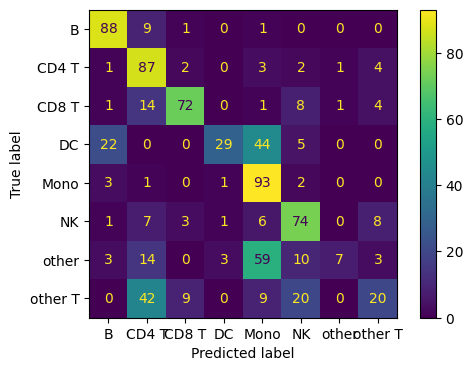

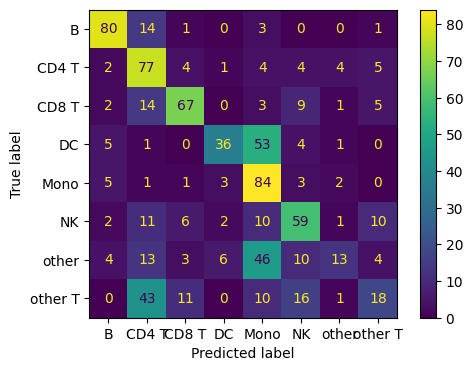

Epoch: 950: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 950: 40it [00:06,  6.12it/s]
Epoch: 951: 40it [00:06,  6.11it/s]
Epoch: 952: 40it [00:06,  6.01it/s]
Epoch: 953: 40it [00:06,  6.07it/s]
Epoch: 954: 40it [00:06,  6.04it/s]
Epoch: 955: 40it [00:06,  5.94it/s]
Epoch: 956: 40it [00:06,  5.98it/s]
Epoch: 957: 40it [00:06,  6.02it/s]
Epoch: 958: 40it [00:06,  5.97it/s]
Epoch: 959: 40it [00:06,  5.99it/s]
Epoch: 960: 40it [00:06,  5.99it/s]
Epoch: 961: 40it [00:06,  5.97it/s]
Epoch: 962: 40it [00

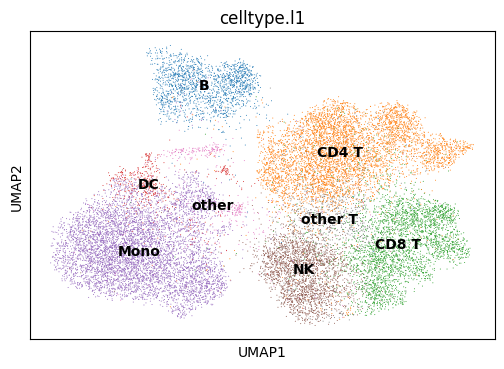

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


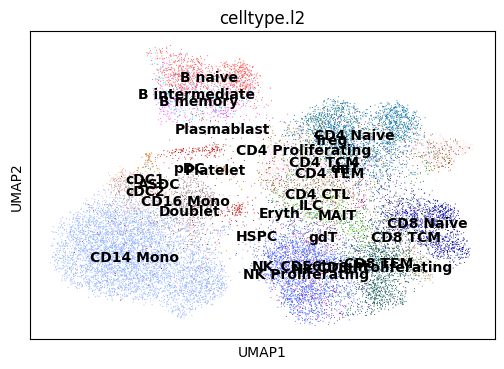

C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
C:\Users\vinee\miniconda3\envs\scvi\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


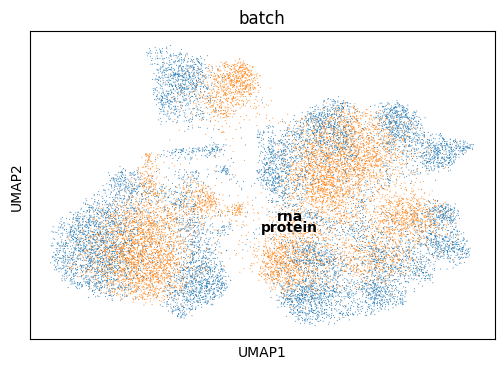

euclidean metric will be used for calculating the distance!
Start the matching process...
Computing the distance matrix...
Getting matchings by Minimum Distance...
Linear assignment completed!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For All matchings: lv1 matching acc: 0.729,
lv2 matching acc: 0.520.
For All matchings: FOSCTTM score: 0.29807047000000003, 
Knn Alignment score: [0.0006 0.0019 0.0029 0.0036 0.0042 0.0049 0.0059 0.0065 0.0068 0.007
 0.0077 0.0083 0.0089 0.0094 0.0099 0.0102 0.011  0.0115 0.0119 0.0127
 0.0135 0.0141 0.0147 0.015  0.0152]
For All matchings: Silhouette F1 score for lv1: 0.5146475701177277, 
Silhouette F1 score for lv2: 0.5054352607128862



Matches are being filtered...
Matchings before filtering:  10000
Threshold distance for filtering the matchings:  2.9241026639938354
Matchings are reduced to 5000 after filtering...


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:423: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[matchings[0]], labels_l1[matchings[1]])
C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For only filtered matchings: lv1 matching acc: 0.818,
lv2 matching acc: 0.619.



Matches are being propagated....


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:460: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[filtered_matchings[0]], labels_l1[filtered_matchings[1]])


Done!


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:41: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return np.mean([labels1[i] == labels2[j] for i, j in zip(matching[0], matching[1])])


For all matchings after propagation: lv1 matching acc: 0.705,
lv2 matching acc: 0.476.


C:\Users\vinee\Desktop\cs690\vineet_ugp\scVI\metrics\match_utils.py:495: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cm = confusion_matrix(labels_l1[propagated_matchings[0]], labels_l1[propagated_matchings[1]])


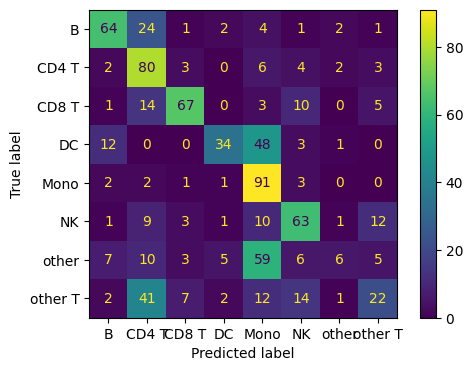

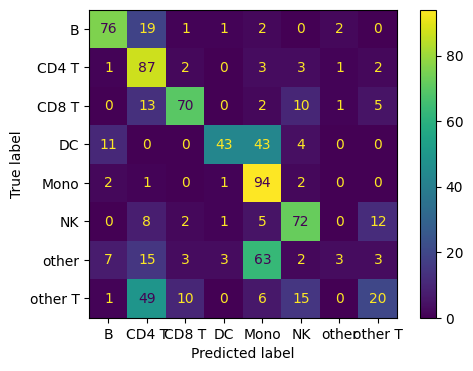

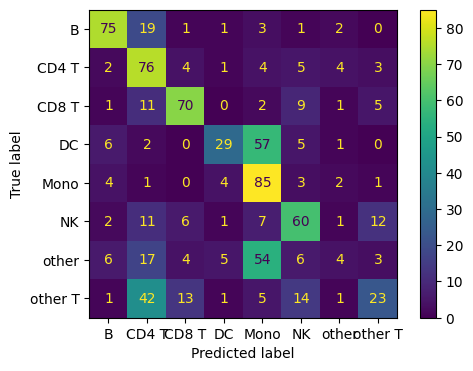

Epoch: 1000: 0it [00:00, ?it/s]C:\Users\vinee\AppData\Local\Temp\ipykernel_22140\3129631169.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"x_unshared":self.unshared_data[idx], "x_shared":self.shared_data[idx], "l1":self.labels_l1[idx], "l2":self.labels_l2[idx], "mean": self.local_mean[idx], "var": self.local_var[idx], "batch": self.batch[idx]}
Epoch: 1000: 40it [00:06,  6.00it/s]


In [16]:
kl_weight = 0.0
metrics = {
    'original': {
        'lv1_acc': [],
        'lv2_acc': [],
        'foscttm_score': []
    },
    'filtered':{
        'lv1_acc': [],
        'lv2_acc': [],
        'foscttm_score': []
    },
    'propagated':{
        'lv1_acc': [],
        'lv2_acc': [],
        'foscttm_score': []
    }
}
for epoch in range(1001):
    loss = 0.0
    rna_recon_loss_piter = 0.0
    rna_kl_div_l_piter = 0.0
    rna_kl_div_z_piter = 0.0
    pro_recon_loss_piter = 0.0
    pro_kl_div_back_pro_piter = 0.0
    pro_kl_div_z_piter = 0.0
    for batchr, batchp in tqdm(zip(rna_dataloader, protein_dataloader), desc="Epoch: {}".format(epoch)):
        optimizer_p.zero_grad()
        optimizer_r.zero_grad()
        optimizer_pr.zero_grad()
        
        y_shared = batchp["y_shared"].to(device)
        x_shared = batchr["x_shared"].to(device)
        y_unshared = batchp["y_unshared"].to(device)
        x_unshared = batchr["x_unshared"].to(device)
        x_batch = batchr["batch"].to(device)
        y_batch = batchp["batch"].to(device)
        # local_mean = rna_dataset.local_mean.reshape(-1,1).expand(x_shared.shape[0], 1).to(device)
        # local_var = rna_dataset.local_var.reshape(-1,1).expand(x_shared.shape[0], 1).to(device)
        local_mean = batchr["mean"].to(device)
        local_var = batchr["var"].to(device)
        
        gene_size = x_shared.size(0)
        ## forward pass of unshared network of proteins and rna
        pro_recon_loss, pro_kl_div_z, pro_kl_div_back_pro, z_pro, _ = podel(y_unshared,cross_inf = False)
        rna_recon_loss, rna_kl_div_l, rna_kl_div_z, z_rna, _ = rodel(x_unshared, local_mean, local_var, cross_inf = False)
        unshared_protein_loss = torch.mean(pro_recon_loss + kl_weight*pro_kl_div_z + pro_kl_div_back_pro)
        unshared_rna_loss = torch.mean(rna_recon_loss + rna_kl_div_l + kl_weight*rna_kl_div_z)
        with torch.no_grad():
            _, _, _, _, _, z_gene, z_protein, _ = prodel(x_shared,y_shared,local_mean,local_var,x_batch,y_batch, cross_inf = False)
        loss_embedd_p = CLIP_loss(z_pro,z_protein)
        loss_embedd_r = CLIP_loss(z_rna,z_gene)
        loss_pro = unshared_protein_loss + loss_embedd_p
        loss_rna = unshared_rna_loss + loss_embedd_r
        loss_rna.backward()
        optimizer_r.step()
        loss_pro.backward()
        optimizer_p.step()
    
        # forward pass of shared_network
        outputs = prodel(x_shared,y_shared,local_mean,local_var,x_batch,y_batch, cross_inf=False)
        shared_loss = torch.mean(outputs[0] + outputs[3]) + kl_weight*torch.mean(outputs[2]) + torch.mean(outputs[1] + outputs[4])
        with torch.no_grad():
            _, _, _, z_pro, _ = podel(y_unshared, cross_inf=False)
            _, _, _, z_rna, _ = rodel(x_unshared,local_mean,local_var, cross_inf=False)
        loss_embedd_p = CLIP_loss(z_pro,outputs[-2])
        loss_embedd_r = CLIP_loss(z_rna,outputs[-3])
        loss = shared_loss + loss_embedd_p + loss_embedd_r
        loss.backward()
        optimizer_pr.step()
        
        # if epoch>10:
        #     optimizer_p.zero_grad()
        #     optimizer_r.zero_grad()
            # optimizer_pr.zero_grad()
            #cross network training
            # with torch.no_grad():
            # _, _, _, _, _, z_gene, z_protein, para_out_prodel = prodel(x_shared,y_shared,local_mean,local_var,x_batch,y_batch, cross_inf = False)
            # pro_recon_loss, _, _, _, _ = podel(y_unshared,cross_inf = True, para = get_paras_for_podel(para_out_prodel, gene_size))
            # rna_recon_loss, _, _, _, _ = rodel(x_unshared, local_mean, local_var, cross_inf = True, para = get_paras_for_rodel(para_out_prodel, gene_size))
            # cross_loss_podel = torch.mean(pro_recon_loss)
            # cross_loss_rodel = torch.mean(rna_recon_loss)
            # cross_loss_rodel.backward(retain_graph=True)
            # optimizer_r.step()
            # cross_loss_podel.backward(retain_graph=True)
            # optimizer_p.step()

            # with torch.no_grad():
            #     _, _, _, z_pro, para_out_podel = podel(y_unshared, cross_inf=False)
            #     _, _, _, z_rna, para_out_rodel = rodel(x_unshared,local_mean,local_var, cross_inf=False)
            # recon_loss_prodel, _, _, _, _, _, _, _ = prodel(x_shared,y_shared,local_mean,local_var,x_batch,y_batch, cross_inf = True, para = get_paras_for_prodel(para_out_rodel, para_out_podel, gene_size))
            # cross_loss_prodel = torch.mean(recon_loss_prodel)
            # cross_loss_prodel.backward()
            # optimizer_pr.step()
         
    kl_weight = min(1.0,(epoch+1)/1000)    
    if (epoch+1) % 50 == 0:
        """Testing loop and visualisation saving"""
        with torch.no_grad():
            shared_rna_data = torch.Tensor(rna_dataset.shared_data)
            shared_pro_data = torch.Tensor(protein_dataset.shared_data)
            labelsl1 = rna_dataset.labels_l1
            labelsl2 = rna_dataset.labels_l2
            shared_tensor_mean = torch.Tensor(rna_dataset.local_mean).to(device)
            shared_tensor_var = torch.Tensor(rna_dataset.local_var).to(device)
            x_batch = torch.Tensor(rna_dataset.batch).to(device)
            y_batch = torch.Tensor(protein_dataset.batch).to(device)
            _, _, _, _, _, z_gene, z_pro, _ = prodel(shared_rna_data, shared_pro_data, shared_tensor_mean, shared_tensor_var, x_batch, y_batch, cross_inf=False)
            adata_plot = ad.AnnData(X= np.concatenate([z_gene.numpy(), z_pro.numpy()], axis=0))
            adata_plot.obs['celltype.l1'] = np.concatenate([labelsl1,labels_l1], axis=0)
            adata_plot.obs['celltype.l2'] = np.concatenate([labelsl2,labels_l2], axis=0)
            adata_plot.obs['batch'] = np.concatenate([["rna"]*z_gene.shape[0], ["protein"]*z_pro.shape[0]], axis=0)
            sc.pp.neighbors(adata_plot)
            sc.tl.umap(adata_plot)
            sc.pl.umap(adata_plot, color='celltype.l1', legend_loc='on data', s=2)            
            sc.pl.umap(adata_plot, color='celltype.l2', legend_loc='on data', s=2)
            sc.pl.umap(adata_plot, color='batch', legend_loc='on data', s=2)            
            met = mu.get_all_metrics(z_gene, z_pro, labelsl1, labelsl2, dim_use = 20, k_max=25, metric='euclidean', assignment_type='mindist', filter_prop=0.5, verbose=True)
            metrics['original']['lv1_acc'].append(met['original']['lv1_acc'])
            metrics['original']['lv2_acc'].append(met['original']['lv2_acc'])
            metrics['original']['foscttm_score'].append(met['original']['foscttm_score'])
            metrics['filtered']['lv1_acc'].append(met['filtered']['lv1_acc'])
            metrics['filtered']['lv2_acc'].append(met['filtered']['lv2_acc'])
            metrics['filtered']['foscttm_score'].append(met['filtered']['foscttm_score'])
            metrics['propagated']['lv1_acc'].append(met['propagated']['lv1_acc'])
            metrics['propagated']['lv2_acc'].append(met['propagated']['lv2_acc'])
            metrics['propagated']['foscttm_score'].append(met['propagated']['foscttm_score'])

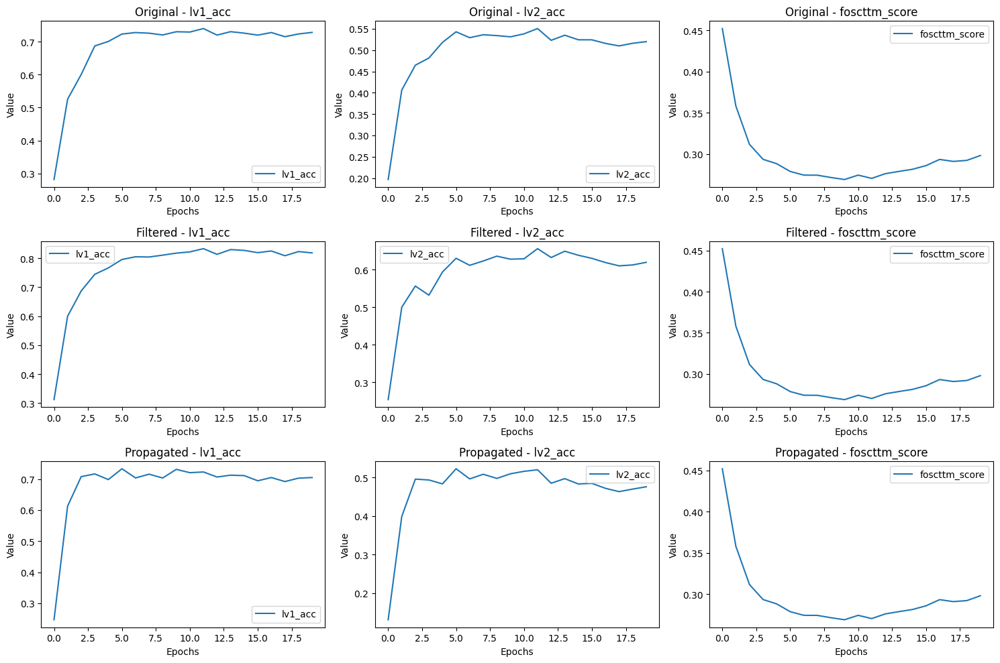

In [17]:
# Create subplots
fig, axs = plt.subplots(3, 3, figsize=(15, 10))

# Plot each metric on a separate subfigure
for i, (category, submetrics) in enumerate(metrics.items()):
    for j, (metric_name, values) in enumerate(submetrics.items()):
        ax = axs[i, j]
        ax.plot(values, label=metric_name)
        ax.set_title(f'{category.capitalize()} - {metric_name}')
        ax.set_xlabel('Epochs')
        ax.set_ylabel('Value')
        ax.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()